# Diabetes Predicion Based on Health Survey

## 1 Exploratory Data Analysis EDA

In [8]:
import random
import numpy as np
import seaborn as sns
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
from scipy.stats import uniform, randint

from xgboost import XGBClassifier

from sklearn import metrics
from sklearn.feature_extraction import DictVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, RobustScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold, GridSearchCV

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.initializers import GlorotNormal
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler
from tensorflow.keras import regularizers


# SMOTE (Synthetic Minority Over-sampling Technique)
from imblearn.over_sampling import SMOTE

In [9]:
# Suppress any warnings
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action="ignore", category=FutureWarning)

# visibility of columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### 1.1 Raw Data Exploration

In [10]:
df = pd.read_csv("../data/LLCP2021.csv")
df.shape

(438693, 303)

In [11]:
df.head()

,_STATE,FMONTH,IDATE,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENM1,PVTRESD1,COLGHOUS,STATERE1,CELPHON1,LADULT1,COLGSEX,NUMADULT,LANDSEX,NUMMEN,NUMWOMEN,RESPSLCT,SAFETIME,CTELNUM1,CELLFON5,CADULT1,CELLSEX,PVTRESD3,CCLGHOUS,CSTATE1,LANDLINE,HHADULT,SEXVAR,GENHLTH,PHYSHLTH,MENTHLTH,POORHLTH,PRIMINSR,PERSDOC3,MEDCOST1,CHECKUP1,EXERANY2,BPHIGH6,BPMEDS,CHOLCHK3,TOLDHI3,CHOLMED3,CVDINFR4,CVDCRHD4,CVDSTRK3,ASTHMA3,ASTHNOW,CHCSCNCR,CHCOCNCR,CHCCOPD3,ADDEPEV3,CHCKDNY2,DIABETE4,DIABAGE3,HAVARTH5,ARTHEXER,ARTHEDU,LMTJOIN3,ARTHDIS2,JOINPAI2,MARITAL,EDUCA,RENTHOM1,NUMHHOL3,NUMPHON3,CPDEMO1B,VETERAN3,EMPLOY1,CHILDREN,INCOME3,PREGNANT,WEIGHT2,HEIGHT3,DEAF,BLIND,DECIDE,DIFFWALK,DIFFDRES,DIFFALON,SMOKE100,SMOKDAY2,USENOW3,ECIGNOW1,ALCDAY5,AVEDRNK3,DRNK3GE5,MAXDRNKS,FLUSHOT7,FLSHTMY3,IMFVPLA2,PNEUVAC4,HIVTST7,HIVTSTD3,FRUIT2,FRUITJU2,FVGREEN1,FRENCHF1,POTATOE1,VEGETAB2,PDIABTST,PREDIAB1,INSULIN1,BLDSUGAR,FEETCHK3,DOCTDIAB,CHKHEMO3,FEETCHK,EYEEXAM1,DIABEYE,DIABEDU,TOLDCFS,HAVECFS,WORKCFS,TOLDHEPC,TRETHEPC,PRIRHEPC,HAVEHEPC,HAVEHEPB,MEDSHEPB,HPVADVC4,HPVADSHT,TETANUS1,SHINGLE2,LCSFIRST,LCSLAST,LCSNUMCG,LCSCTSCN,HADMAM,HOWLONG,CERVSCRN,CRVCLCNC,CRVCLPAP,CRVCLHPV,HADHYST2,PSATEST1,PSATIME1,PCPSARS2,PCSTALK,HADSIGM4,COLNSIGM,COLNTES1,SIGMTES1,LASTSIG4,COLNCNCR,VIRCOLO1,VCLNTES1,SMALSTOL,STOLTEST,STOOLDN1,BLDSTFIT,SDNATES1,CNCRDIFF,CNCRAGE,CNCRTYP1,CSRVTRT3,CSRVDOC1,CSRVSUM,CSRVRTRN,CSRVINST,CSRVINSR,CSRVDEIN,CSRVCLIN,CSRVPAIN,CSRVCTL2,HOMBPCHK,HOMRGCHK,WHEREBP,SHAREBP,WTCHSALT,DRADVISE,CIMEMLOS,CDHOUSE,CDASSIST,CDHELP,CDSOCIAL,CDDISCUS,CAREGIV1,CRGVREL4,CRGVLNG1,CRGVHRS1,CRGVPRB3,CRGVALZD,CRGVPER1,CRGVHOU1,CRGVEXPT,ACEDEPRS,ACEDRINK,ACEDRUGS,ACEPRISN,ACEDIVRC,ACEPUNCH,ACEHURT1,ACESWEAR,ACETOUCH,ACETTHEM,ACEHVSEX,ACEADSAF,ACEADNED,MARIJAN1,USEMRJN3,RSNMRJN2,LASTSMK2,STOPSMK2,FIREARM5,GUNLOAD,LOADULK2,RCSGENDR,RCSRLTN2,CASTHDX2,CASTHNO2,BIRTHSEX,SOMALE,SOFEMALE,TRNSGNDR,QSTVER,QSTLANG,_METSTAT,_URBSTAT,MSCODE,_STSTR,_STRWT,_RAWRAKE,_WT2RAKE,_IMPRACE,_CHISPNC,_CRACE1,_CPRACE1,CAGEG,_CLLCPWT,_DUALUSE,_DUALCOR,_LLCPWT2,_LLCPWT,_RFHLTH,_PHYS14D,_MENT14D,_HLTHPLN,_HCVU652,_TOTINDA,_RFHYPE6,_CHOLCH3,_RFCHOL3,_MICHD,_LTASTH1,_CASTHM1,_ASTHMS1,_DRDXAR3,_LMTACT3,_LMTWRK3,_PRACE1,_MRACE1,_HISPANC,_RACE,_RACEG21,_RACEGR3,_RACEPRV,_SEX,_AGEG5YR,_AGE65YR,_AGE80,_AGE_G,HTIN4,HTM4,WTKG3,_BMI5,_BMI5CAT,_RFBMI5,_CHLDCNT,_EDUCAG,_INCOMG1,_SMOKER3,_RFSMOK3,_CURECI1,DRNKANY5,DROCDY3_,_RFBING5,_DRNKWK1,_RFDRHV7,_FLSHOT7,_PNEUMO3,_AIDTST4,FTJUDA2_,FRUTDA2_,GRENDA1_,FRNCHDA_,POTADA1_,VEGEDA2_,_MISFRT1,_MISVEG1,_FRTRES1,_VEGRES1,_FRUTSU1,_VEGESU1,_FRTLT1A,_VEGLT1A,_FRT16A,_VEG23A,_FRUITE1,_VEGETE1
0,1,1,1192021,1,19,2021,1100,2021000001,2021000001,1.0,1.0,NaN,1.0,2.0,1.0,NaN,2.0,NaN,1.0,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,5.0,20.0,10.0,88.0,3.0,1.0,2.0,2.0,2.0,3.0,NaN,2.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,3.0,NaN,1.0,2.0,2.0,2.0,1.0,8.0,1.0,4.0,1.0,1.0,1.0,1.0,2.0,7.0,88.0,5.0,NaN,72.0,411.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,3.0,3.0,3.0,888.0,NaN,NaN,NaN,1.0,92020.0,1.0,1.0,2.0,NaN,101.0,555.0,204.0,203.0,201.0,101.0,2.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,5.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,1,1.0,1.0,1.0,11011,39.766158,2.0,79.532315,1,9.0,NaN,NaN,NaN,NaN,1,0.519019,874.242902,744.745531,2,3,2,1,9,2,1,1,2.0,2.0,2,2,1,1.0,2.0,1.0,1.0,1.0,2,1,1,1,1,2,11,2,70,6,59.0,150.0,3266.0,1454.0,1.0,1,1,2,3,3,1,1,2,0,1,0,1,1.0,1.0,2.0,0.0,100.0,57.0,43.0,14.0,100.0,0,0,1,1,100.0,214.0,1,1,1,1,0,0
1,1,1,1212021,1,21,2021,1100,2021000002,2021000002,1.0,1.0,NaN,1.0,2.0,1.0,NaN,2.0,NaN,1.0,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,3.0,88.0,88.0,NaN,1.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1

In [12]:
df.dtypes

_STATE        int64
FMONTH        int64
IDATE         int64
IMONTH        int64
IDAY          int64
IYEAR         int64
DISPCODE      int64
SEQNO         int64
_PSU          int64
CTELENM1    float64
PVTRESD1    float64
COLGHOUS    float64
STATERE1    float64
CELPHON1    float64
LADULT1     float64
COLGSEX     float64
NUMADULT    float64
LANDSEX     float64
NUMMEN      float64
NUMWOMEN    float64
RESPSLCT    float64
SAFETIME    float64
CTELNUM1    float64
CELLFON5    float64
CADULT1     float64
CELLSEX     float64
PVTRESD3    float64
CCLGHOUS    float64
CSTATE1     float64
LANDLINE    float64
HHADULT     float64
SEXVAR        int64
GENHLTH     float64
PHYSHLTH    float64
MENTHLTH    float64
POORHLTH    float64
PRIMINSR    float64
PERSDOC3    float64
MEDCOST1    float64
CHECKUP1    float64
EXERANY2    float64
BPHIGH6     float64
BPMEDS      float64
CHOLCHK3    float64
TOLDHI3     float64
CHOLMED3    float64
CVDINFR4    float64
CVDCRHD4    float64
CVDSTRK3    float64
ASTHMA3     float64


#### 1.1.1 Missing values analysis

In [13]:
missing = (df.isnull().sum()/len(df)*100).sort_values(ascending=False).reset_index()
missing  = pd.DataFrame(missing)
missing = missing.set_axis(['Feature', '% missing'], axis=1)
missing

,Feature,% missing
0,HAVECFS,100.000000
1,WORKCFS,100.000000
2,TOLDCFS,100.000000
3,COLGHOUS,99.993162
4,COLGSEX,99.993162
5,SIGMTES1,99.985639
6,MEDSHEPB,99.978345
7,TRETHEPC,99.963072
8,PRIRHEPC,99.963072
9,HAVEHEPC,99.963072


In [14]:
df['DIABETE4'].value_counts()

DIABETE4
3.0    366342
1.0     57616
4.0      9942
2.0      3808
7.0       613
9.0       369
Name: count, dtype: int64

#### 1.1.1.2 Missing value thressholding and preliminary selection of features

In [15]:
selected_features = list(missing[missing['% missing'] < 15]['Feature'].values)
selected_features

['CHOLMED3',
 '_RFCHOL3',
 'TOLDHI3',
 '_VEGESU1',
 '_FRUTSU1',
 'VEGEDA2_',
 'POTADA1_',
 '_BMI5CAT',
 '_BMI5',
 'FRNCHDA_',
 'FTJUDA2_',
 'GRENDA1_',
 'FRUTDA2_',
 'VEGETAB2',
 'WTKG3',
 'POTATOE1',
 'FRENCHF1',
 'FVGREEN1',
 'FRUITJU2',
 'FRUIT2',
 '_AIDTST4',
 'HIVTST7',
 'PNEUVAC4',
 'FLUSHOT7',
 'HTIN4',
 'HTM4',
 'ALCDAY5',
 'ECIGNOW1',
 'USENOW3',
 'SMOKE100',
 'DIFFALON',
 'DIFFDRES',
 'DIFFWALK',
 'DECIDE',
 'BLIND',
 'DEAF',
 'HEIGHT3',
 'WEIGHT2',
 'INCOME3',
 '_METSTAT',
 '_URBSTAT',
 'CHILDREN',
 '_MICHD',
 'EMPLOY1',
 '_LMTWRK3',
 '_LMTACT3',
 '_DRDXAR3',
 'VETERAN3',
 'CPDEMO1B',
 'RENTHOM1',
 'EDUCA',
 'MARITAL',
 'MEDCOST1',
 '_MRACE1',
 '_PRACE1',
 'GENHLTH',
 'CHCOCNCR',
 'PRIMINSR',
 'ADDEPEV3',
 'CHCKDNY2',
 'DIABETE4',
 'HAVARTH5',
 'CHCCOPD3',
 'PHYSHLTH',
 'CHECKUP1',
 'BPHIGH6',
 'CVDINFR4',
 'CVDCRHD4',
 'CVDSTRK3',
 'ASTHMA3',
 'EXERANY2',
 'CHOLCHK3',
 'PERSDOC3',
 'MENTHLTH',
 'CHCSCNCR',
 '_SMOKER3',
 '_CHLDCNT',
 '_RFBMI5',
 '_AGE80',
 '_EDUCAG',
 '_INCO

In [16]:
df_selection = df[selected_features]
df_selection.head()

,CHOLMED3,_RFCHOL3,TOLDHI3,_VEGESU1,_FRUTSU1,VEGEDA2_,POTADA1_,_BMI5CAT,_BMI5,FRNCHDA_,FTJUDA2_,GRENDA1_,FRUTDA2_,VEGETAB2,WTKG3,POTATOE1,FRENCHF1,FVGREEN1,FRUITJU2,FRUIT2,_AIDTST4,HIVTST7,PNEUVAC4,FLUSHOT7,HTIN4,HTM4,ALCDAY5,ECIGNOW1,USENOW3,SMOKE100,DIFFALON,DIFFDRES,DIFFWALK,DECIDE,BLIND,DEAF,HEIGHT3,WEIGHT2,INCOME3,_METSTAT,_URBSTAT,CHILDREN,_MICHD,EMPLOY1,_LMTWRK3,_LMTACT3,_DRDXAR3,VETERAN3,CPDEMO1B,RENTHOM1,EDUCA,MARITAL,MEDCOST1,_MRACE1,_PRACE1,GENHLTH,CHCOCNCR,PRIMINSR,ADDEPEV3,CHCKDNY2,DIABETE4,HAVARTH5,CHCCOPD3,PHYSHLTH,CHECKUP1,BPHIGH6,CVDINFR4,CVDCRHD4,CVDSTRK3,ASTHMA3,EXERANY2,CHOLCHK3,PERSDOC3,MENTHLTH,CHCSCNCR,_SMOKER3,_CHLDCNT,_RFBMI5,_AGE80,_EDUCAG,_INCOMG1,_MISFRT1,DRNKANY5,_RFSMOK3,_CURECI1,_MISVEG1,DROCDY3_,_RFBING5,_DRNKWK1,_RFDRHV7,_VEGRES1,_FRTRES1,_FRTLT1A,_VEGLT1A,_FRT16A,_VEG23A,_FRUITE1,_AGE_G,_STATE,_AGE65YR,FMONTH,_IMPRACE,_WT2RAKE,_RAWRAKE,_STRWT,_STSTR,QSTLANG,QSTVER,SEXVAR,_LLCPWT2,_PSU,SEQNO,DISPCODE,IYEAR,IDAY,IMONTH,IDATE,_DUALUSE,_LLCPWT,_AGEG5YR,_CASTHM1,_SEX,_RACEPRV,_RACEGR3,_RACEG21,_RACE,_HISPANC,_ASTHMS1,_LTASTH1,_RFHLTH,_CHOLCH3,_RFHYPE6,_TOTINDA,_HCVU652,_HLTHPLN,_MENT14D,_PHYS14D,_VEGETE1
0,1.0,2.0,1.0,214.0,100.0,100.0,14.0,1.0,1454.0,43.0,0.0,57.0,100.0,101.0,3266.0,201.0,203.0,204.0,555.0,101.0,2.0,2.0,1.0,1.0,59.0,150.0,888.0,3.0,3.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,411.0,72.0,5.0,1.0,1.0,88.0,2.0,7.0,1.0,2.0,1.0,2.0,1.0,1.0,4.0,1.0,2.0,1.0,1.0,5.0,2.0,3.0,2.0,2.0,3.0,1.0,1.0,20.0,2.0,3.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,10.0,2.0,3,1,1,70,2,3,0,2,1,1,0,0,1,0,1,1,1,1,1,1,1,0,6,1,2,1,1,79.532315,2.0,39.766158,11011,1,10,2,874.242902,2021000001,2021000001,1100,2021,19,1,1192021,1,744.745531,11,2,2,1,1,1,1,2,1,2,2,1,1,2,9,1,2,3,0
1,1.0,2.0,1.0,128.0,100.0,100.0,14.0,NaN,NaN,0.0,0.0,14.0,100.0,207.0,NaN,201.0,555.0,201.0,555.0,101.0,2.0,2.0,2.0,2.0,66.0,168.0,888.0,3.0,3.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,506.0,7777.0,77.0,1.0,1.0,88.0,1.0,8.0,1.0,1.0,1.0,2.0,1.0,1.0,6.0,9.0,2.0,2.0,2.0,3.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,88.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,88.0,2.0,4,1,9,67,4,9,0,2,1,1,0,0,1,0,1,1,1,1,1,1,1,0,6,1,2,1,2,79.532315,2.0,39.766158,11011,1,10,2,874.242902,2021000002,2021000002,1100,2021,21,1,1212021,1,299.137394,10,1,2,2,2,2,2,2,3,1,1,1,2,1,9,1,1,1,0
2,2.0,1.0,2.0,71.0,100.0,43.0,14.0,3.0,2829.0,14.0,0.0,0.0,100.0,203.0,7711.0,201.0,201.0,555.0,555.0,101.0,2.0,2.0,2.0,2.0,65.0,165.0,888.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,505.0,170.0,3.0,1.0,1.0,88.0,1.0,7.0,3.0,3.0,2.0,2.0,1.0,1.0,4.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,88.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,88.0,2.0,4,1,2,72,2,2,0,2,1,1,0,0,1,0,1,1,1,1,2,1,1,0,6,1,2,1,2,79.532315,2.0,39.766158,11011,1,10,2,874.242902,2021000003,2021000003,1100,2021,21,1,1212021,1,587.862986,11,1,2,2,2,2,2,2,3,1,1,1,2,2,9,1,1,1,0
3,2.0,2.0,1.0,165.0,114.0,71.0,27.0,4.0,3347.0,57.0,71.0,10.0,43.0,205.0,8845.0,308.0,204.0,303.0,205.0,203.0,2.0,2.0,2.0,1.0,64.0,163.0,101.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,504.0,195.0,7.0,1.0,1.0,88.0,2.0,7.0,3.0,3.0,2.0,2.0,1.0,1.0,4.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,88.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,10.0,2.0,4,1,2,62,2,5,0,1,1,1,0,14,2,300,1,1,1,1,1,1,1,0,5,1,1,1,1,79.532315,2.0,39.766158,11011,1,10,2,874.242902,2021000004,2021000004,1100,2021,17,1,1172021,1,1099.621570,9,1,2,1,1,1,1,2,3,1,1,1,2,1,1,1,2,1,0
4,1.0,2.0,1.0,258.0,100.0,100.0,29.0,3.0,2873.0,29.0,0.0,100.0,100.0,101.0,9344.0,202.0,202.0,101.0,555.0,101.0,1.0,1.0,1.0,1.0,71.0,180.0,888.0,3.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,511.0,206.0,4.0,2.0,1.0,88.0,1.0,8.0,3.0,3.0,2.0,2.0,8.0,1.0,3.0,1.0,2.0,7.0,1.0,5.0,2.0,3.0,2.0,2.0,1.0,2.0,2.0,30.0,1.0,4.0,1.0,7.0,1.0,2.0,1.0,2.0,1.0,88.0,2.0,4,1,2,76,1,2,0,2,1,1,0,0,1,0,1,1,1,1,1,1,1,0,6,1,2,1,6,79.532315,2.0,39.766158,11011,1,10,1,2144.769000,2021000005,2021000005,1100,2021,15,1,1152021,9,1711.825870,12,1,1,7,4,2,7,2,3,1,2,1,1,1,9,1,1,3,0


#### 1.1.1.3 Target Feature Distribution

In [17]:
Target = 'DIABETE4'

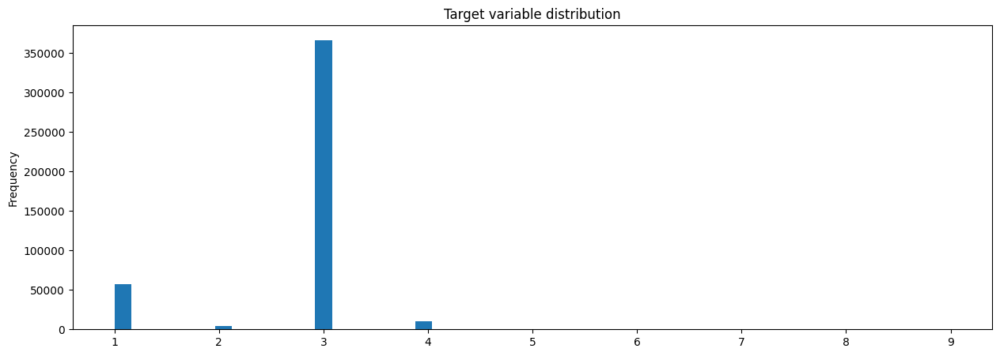

In [18]:
df_selection[Target].plot(kind='hist', bins=50, figsize=(15, 5), title='Target variable distribution')
plt.show()

In [19]:
df_selection['DIABETE4'].value_counts()

DIABETE4
3.0    366342
1.0     57616
4.0      9942
2.0      3808
7.0       613
9.0       369
Name: count, dtype: int64

In [20]:
df_selection.shape

(438693, 138)

![title](../media/DIABETE4.png)

##### 1.1.1.3.1 Target Feature Binarization

In [21]:
mask = (
    (df_selection['DIABETE4'] == 2) | (df_selection['DIABETE4'] == 4) |
    (df_selection['DIABETE4'] == 7) | (df_selection['DIABETE4'] == 9)
)
mask.sum()

14732

In [22]:
df_binary = df_selection[~mask]
df_binary.shape

(423961, 138)

In [23]:
binary_mapping = {3:0, 1:1}
df_binary['DIABETE4'] = df_binary['DIABETE4'].replace(binary_mapping)
df_binary['DIABETE4'].value_counts()

DIABETE4
0.0    366342
1.0     57616
Name: count, dtype: int64

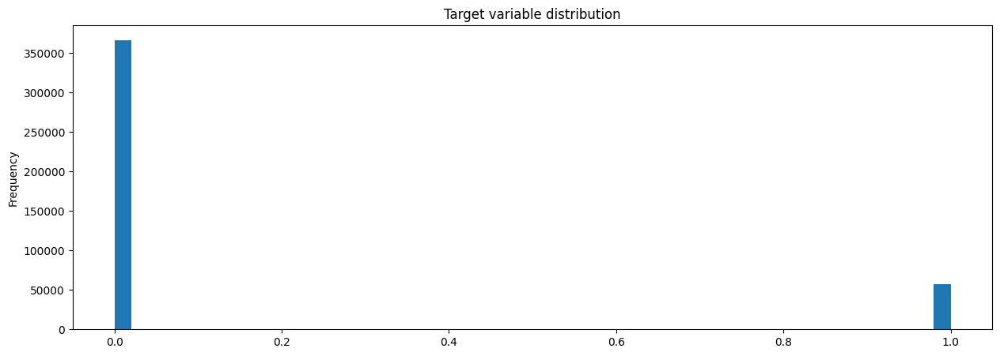

In [24]:
df_binary['DIABETE4'].plot(kind='hist', bins=50, figsize=(15, 5), title='Target variable distribution')
plt.show()

#### 1.1.1.4 Categorical Value counts and survey encoding.

In [25]:
# Number of unique values in each column of training data
unique_val_count_by_column = (df_binary.nunique())
print(unique_val_count_by_column[unique_val_count_by_column > 0])

CHOLMED3         4
_RFCHOL3         3
TOLDHI3          4
_VEGESU1      2329
_FRUTSU1       715
VEGEDA2_       154
POTADA1_       128
_BMI5CAT         4
_BMI5         3843
FRNCHDA_       132
FTJUDA2_       128
GRENDA1_       156
FRUTDA2_       157
VEGETAB2       165
WTKG3          566
POTATOE1       140
FRENCHF1       145
FVGREEN1       170
FRUITJU2       139
FRUIT2         171
_AIDTST4         3
HIVTST7          4
PNEUVAC4         4
FLUSHOT7         4
HTIN4           57
HTM4           110
ALCDAY5         40
ECIGNOW1         6
USENOW3          5
SMOKE100         4
DIFFALON         4
DIFFDRES         4
DIFFWALK         4
DECIDE           4
BLIND            4
DEAF             4
HEIGHT3        142
WEIGHT2        580
INCOME3         13
_METSTAT         2
_URBSTAT         2
CHILDREN        30
_MICHD           2
EMPLOY1          9
_LMTWRK3         4
_LMTACT3         4
_DRDXAR3         2
VETERAN3         4
CPDEMO1B         9
RENTHOM1         5
EDUCA            7
MARITAL          7
MEDCOST1    

In [26]:
low_cardinality_cols = [cname for cname in df_binary.columns if df_binary[cname].nunique() < 10 and
                        df_binary[cname].dtype == 'object']
low_cardinality_cols

[]

In [27]:
low_cardinality_cols_encode = [cname for cname in df_binary.columns if df_binary[cname].nunique() < 10]
low_cardinality_cols_encode

['CHOLMED3',
 '_RFCHOL3',
 'TOLDHI3',
 '_BMI5CAT',
 '_AIDTST4',
 'HIVTST7',
 'PNEUVAC4',
 'FLUSHOT7',
 'ECIGNOW1',
 'USENOW3',
 'SMOKE100',
 'DIFFALON',
 'DIFFDRES',
 'DIFFWALK',
 'DECIDE',
 'BLIND',
 'DEAF',
 '_METSTAT',
 '_URBSTAT',
 '_MICHD',
 'EMPLOY1',
 '_LMTWRK3',
 '_LMTACT3',
 '_DRDXAR3',
 'VETERAN3',
 'CPDEMO1B',
 'RENTHOM1',
 'EDUCA',
 'MARITAL',
 'MEDCOST1',
 '_MRACE1',
 'GENHLTH',
 'CHCOCNCR',
 'ADDEPEV3',
 'CHCKDNY2',
 'DIABETE4',
 'HAVARTH5',
 'CHCCOPD3',
 'CHECKUP1',
 'BPHIGH6',
 'CVDINFR4',
 'CVDCRHD4',
 'CVDSTRK3',
 'ASTHMA3',
 'EXERANY2',
 'CHOLCHK3',
 'PERSDOC3',
 'CHCSCNCR',
 '_SMOKER3',
 '_CHLDCNT',
 '_RFBMI5',
 '_EDUCAG',
 '_INCOMG1',
 '_MISFRT1',
 'DRNKANY5',
 '_RFSMOK3',
 '_CURECI1',
 '_MISVEG1',
 '_RFBING5',
 '_RFDRHV7',
 '_VEGRES1',
 '_FRTRES1',
 '_FRTLT1A',
 '_VEGLT1A',
 '_FRT16A',
 '_VEG23A',
 '_FRUITE1',
 '_AGE_G',
 '_AGE65YR',
 '_IMPRACE',
 'QSTLANG',
 'QSTVER',
 'SEXVAR',
 'DISPCODE',
 'IYEAR',
 '_DUALUSE',
 '_CASTHM1',
 '_SEX',
 '_RACEPRV',
 '_RACEGR3',
 

In [28]:
df_binary[low_cardinality_cols_encode].head()

,CHOLMED3,_RFCHOL3,TOLDHI3,_BMI5CAT,_AIDTST4,HIVTST7,PNEUVAC4,FLUSHOT7,ECIGNOW1,USENOW3,SMOKE100,DIFFALON,DIFFDRES,DIFFWALK,DECIDE,BLIND,DEAF,_METSTAT,_URBSTAT,_MICHD,EMPLOY1,_LMTWRK3,_LMTACT3,_DRDXAR3,VETERAN3,CPDEMO1B,RENTHOM1,EDUCA,MARITAL,MEDCOST1,_MRACE1,GENHLTH,CHCOCNCR,ADDEPEV3,CHCKDNY2,DIABETE4,HAVARTH5,CHCCOPD3,CHECKUP1,BPHIGH6,CVDINFR4,CVDCRHD4,CVDSTRK3,ASTHMA3,EXERANY2,CHOLCHK3,PERSDOC3,CHCSCNCR,_SMOKER3,_CHLDCNT,_RFBMI5,_EDUCAG,_INCOMG1,_MISFRT1,DRNKANY5,_RFSMOK3,_CURECI1,_MISVEG1,_RFBING5,_RFDRHV7,_VEGRES1,_FRTRES1,_FRTLT1A,_VEGLT1A,_FRT16A,_VEG23A,_FRUITE1,_AGE_G,_AGE65YR,_IMPRACE,QSTLANG,QSTVER,SEXVAR,DISPCODE,IYEAR,_DUALUSE,_CASTHM1,_SEX,_RACEPRV,_RACEGR3,_RACEG21,_RACE,_HISPANC,_ASTHMS1,_LTASTH1,_RFHLTH,_CHOLCH3,_RFHYPE6,_TOTINDA,_HCVU652,_HLTHPLN,_MENT14D,_PHYS14D,_VEGETE1
0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,1.0,3.0,3.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,7.0,1.0,2.0,1.0,2.0,1.0,1.0,4.0,1.0,2.0,1.0,5.0,2.0,2.0,2.0,0.0,1.0,1.0,2.0,3.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,3,1,1,2,3,0,2,1,1,0,1,1,1,1,1,1,1,1,0,6,2,1,1,10,2,1100,2021,1,2,2,1,1,1,1,2,1,2,2,1,1,2,9,1,2,3,0
1,1.0,2.0,1.0,NaN,2.0,2.0,2.0,2.0,3.0,3.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,8.0,1.0,1.0,1.0,2.0,1.0,1.0,6.0,9.0,2.0,2.0,3.0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,4,1,9,4,9,0,2,1,1,0,1,1,1,1,1,1,1,1,0,6,2,2,1,10,2,1100,2021,1,1,2,2,2,2,2,2,3,1,1,1,2,1,9,1,1,1,0
2,2.0,1.0,2.0,3.0,2.0,2.0,2.0,2.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,7.0,3.0,3.0,2.0,2.0,1.0,1.0,4.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,4,1,2,2,2,0,2,1,1,0,1,1,1,1,1,2,1,1,0,6,2,2,1,10,2,1100,2021,1,1,2,2,2,2,2,2,3,1,1,1,2,2,9,1,1,1,0
3,2.0,2.0,1.0,4.0,2.0,2.0,2.0,1.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,7.0,3.0,3.0,2.0,2.0,1.0,1.0,4.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,4,1,2,2,5,0,1,1,1,0,2,1,1,1,1,1,1,1,0,5,1,1,1,10,2,1100,2021,1,1,2,1,1,1,1,2,3,1,1,1,2,1,1,1,2,1,0
4,1.0,2.0,1.0,3.0,1.0,1.0,1.0,1.0,3.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,8.0,3.0,3.0,2.0,2.0,8.0,1.0,3.0,1.0,2.0,7.0,5.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,4.0,1.0,7.0,1.0,2.0,1.0,2.0,1.0,2.0,4,1,2,1,2,0,2,1,1,0,1,1,1,1,1,1,1,1,0,6,2,6,1,10,1,1100,2021,9,1,1,7,4,2,7,2,3,1,2,1,1,1,9,1,1,3,0


In [29]:
categorical_encoded_cols = list(df_binary[low_cardinality_cols_encode].columns)
categorical_encoded_cols

['CHOLMED3',
 '_RFCHOL3',
 'TOLDHI3',
 '_BMI5CAT',
 '_AIDTST4',
 'HIVTST7',
 'PNEUVAC4',
 'FLUSHOT7',
 'ECIGNOW1',
 'USENOW3',
 'SMOKE100',
 'DIFFALON',
 'DIFFDRES',
 'DIFFWALK',
 'DECIDE',
 'BLIND',
 'DEAF',
 '_METSTAT',
 '_URBSTAT',
 '_MICHD',
 'EMPLOY1',
 '_LMTWRK3',
 '_LMTACT3',
 '_DRDXAR3',
 'VETERAN3',
 'CPDEMO1B',
 'RENTHOM1',
 'EDUCA',
 'MARITAL',
 'MEDCOST1',
 '_MRACE1',
 'GENHLTH',
 'CHCOCNCR',
 'ADDEPEV3',
 'CHCKDNY2',
 'DIABETE4',
 'HAVARTH5',
 'CHCCOPD3',
 'CHECKUP1',
 'BPHIGH6',
 'CVDINFR4',
 'CVDCRHD4',
 'CVDSTRK3',
 'ASTHMA3',
 'EXERANY2',
 'CHOLCHK3',
 'PERSDOC3',
 'CHCSCNCR',
 '_SMOKER3',
 '_CHLDCNT',
 '_RFBMI5',
 '_EDUCAG',
 '_INCOMG1',
 '_MISFRT1',
 'DRNKANY5',
 '_RFSMOK3',
 '_CURECI1',
 '_MISVEG1',
 '_RFBING5',
 '_RFDRHV7',
 '_VEGRES1',
 '_FRTRES1',
 '_FRTLT1A',
 '_VEGLT1A',
 '_FRT16A',
 '_VEG23A',
 '_FRUITE1',
 '_AGE_G',
 '_AGE65YR',
 '_IMPRACE',
 'QSTLANG',
 'QSTVER',
 'SEXVAR',
 'DISPCODE',
 'IYEAR',
 '_DUALUSE',
 '_CASTHM1',
 '_SEX',
 '_RACEPRV',
 '_RACEGR3',
 

In [30]:
df_binary_cat = df_binary.copy()
df_binary_cat[categorical_encoded_cols] =  df_binary_cat[categorical_encoded_cols].astype('category')
df_binary_cat.dtypes

CHOLMED3    category
_RFCHOL3    category
TOLDHI3     category
_VEGESU1     float64
_FRUTSU1     float64
VEGEDA2_     float64
POTADA1_     float64
_BMI5CAT    category
_BMI5        float64
FRNCHDA_     float64
FTJUDA2_     float64
GRENDA1_     float64
FRUTDA2_     float64
VEGETAB2     float64
WTKG3        float64
POTATOE1     float64
FRENCHF1     float64
FVGREEN1     float64
FRUITJU2     float64
FRUIT2       float64
_AIDTST4    category
HIVTST7     category
PNEUVAC4    category
FLUSHOT7    category
HTIN4        float64
HTM4         float64
ALCDAY5      float64
ECIGNOW1    category
USENOW3     category
SMOKE100    category
DIFFALON    category
DIFFDRES    category
DIFFWALK    category
DECIDE      category
BLIND       category
DEAF        category
HEIGHT3      float64
WEIGHT2      float64
INCOME3      float64
_METSTAT    category
_URBSTAT    category
CHILDREN     float64
_MICHD      category
EMPLOY1     category
_LMTWRK3    category
_LMTACT3    category
_DRDXAR3    category
VETERAN3    c

In [31]:
high_cardinality_cols = [cname for cname in df_binary.columns if df_binary[cname].nunique() >= 10 and
                        df_binary[cname].dtype == 'object']
high_cardinality_cols

[]

In [32]:
numerical_cols = [cname for cname in df_binary.columns if df_binary[cname].dtype in ['int64', 'float']]
#numerical_cols.remove(Target)
numerical_cols

['CHOLMED3',
 '_RFCHOL3',
 'TOLDHI3',
 '_VEGESU1',
 '_FRUTSU1',
 'VEGEDA2_',
 'POTADA1_',
 '_BMI5CAT',
 '_BMI5',
 'FRNCHDA_',
 'FTJUDA2_',
 'GRENDA1_',
 'FRUTDA2_',
 'VEGETAB2',
 'WTKG3',
 'POTATOE1',
 'FRENCHF1',
 'FVGREEN1',
 'FRUITJU2',
 'FRUIT2',
 '_AIDTST4',
 'HIVTST7',
 'PNEUVAC4',
 'FLUSHOT7',
 'HTIN4',
 'HTM4',
 'ALCDAY5',
 'ECIGNOW1',
 'USENOW3',
 'SMOKE100',
 'DIFFALON',
 'DIFFDRES',
 'DIFFWALK',
 'DECIDE',
 'BLIND',
 'DEAF',
 'HEIGHT3',
 'WEIGHT2',
 'INCOME3',
 '_METSTAT',
 '_URBSTAT',
 'CHILDREN',
 '_MICHD',
 'EMPLOY1',
 '_LMTWRK3',
 '_LMTACT3',
 '_DRDXAR3',
 'VETERAN3',
 'CPDEMO1B',
 'RENTHOM1',
 'EDUCA',
 'MARITAL',
 'MEDCOST1',
 '_MRACE1',
 '_PRACE1',
 'GENHLTH',
 'CHCOCNCR',
 'PRIMINSR',
 'ADDEPEV3',
 'CHCKDNY2',
 'DIABETE4',
 'HAVARTH5',
 'CHCCOPD3',
 'PHYSHLTH',
 'CHECKUP1',
 'BPHIGH6',
 'CVDINFR4',
 'CVDCRHD4',
 'CVDSTRK3',
 'ASTHMA3',
 'EXERANY2',
 'CHOLCHK3',
 'PERSDOC3',
 'MENTHLTH',
 'CHCSCNCR',
 '_SMOKER3',
 '_CHLDCNT',
 '_RFBMI5',
 '_AGE80',
 '_EDUCAG',
 '_INCO

In [33]:
correlation_matrix = df_binary.select_dtypes(exclude=['object']).corr()

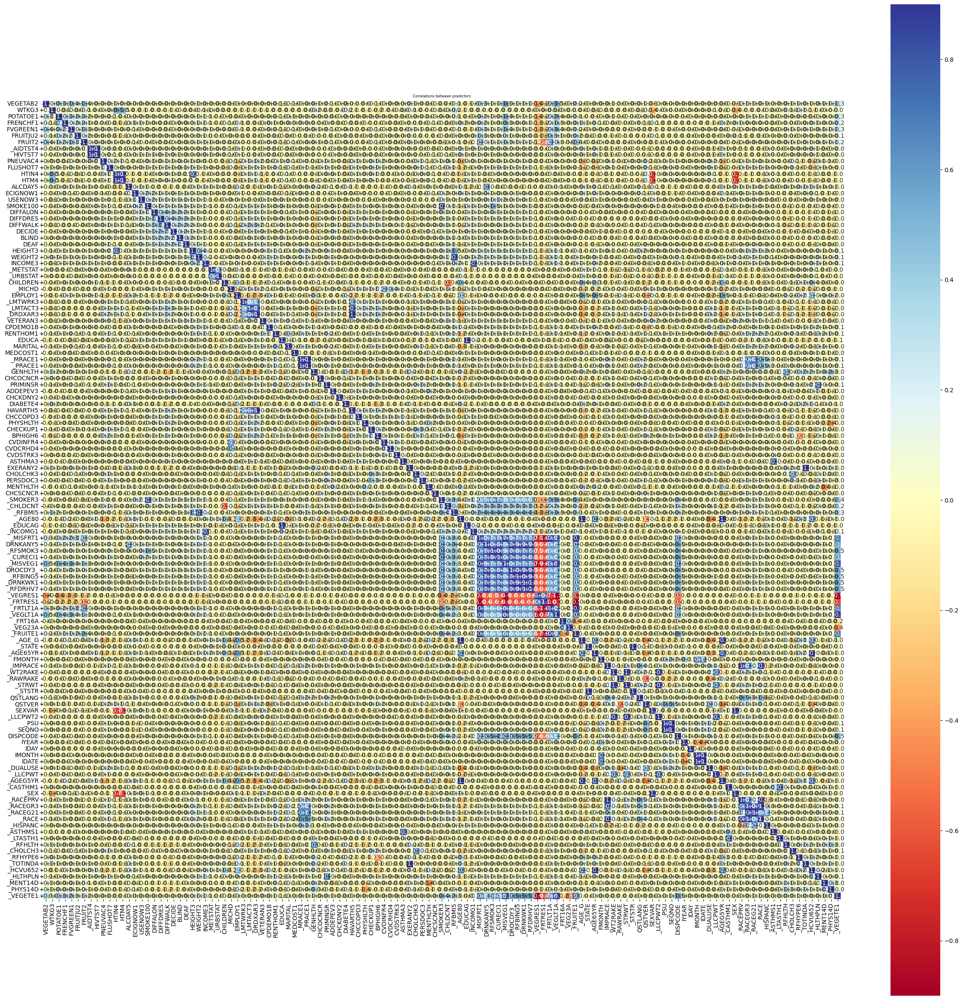

In [244]:
plt.figure(figsize=(30,30))
sns.heatmap(correlation_matrix, cmap="RdYlBu", 
    annot=True, square=True,
    vmin=-0.9, vmax=0.9, fmt="+.1f")
plt.title("Correlations between predictors", fontsize=6);
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

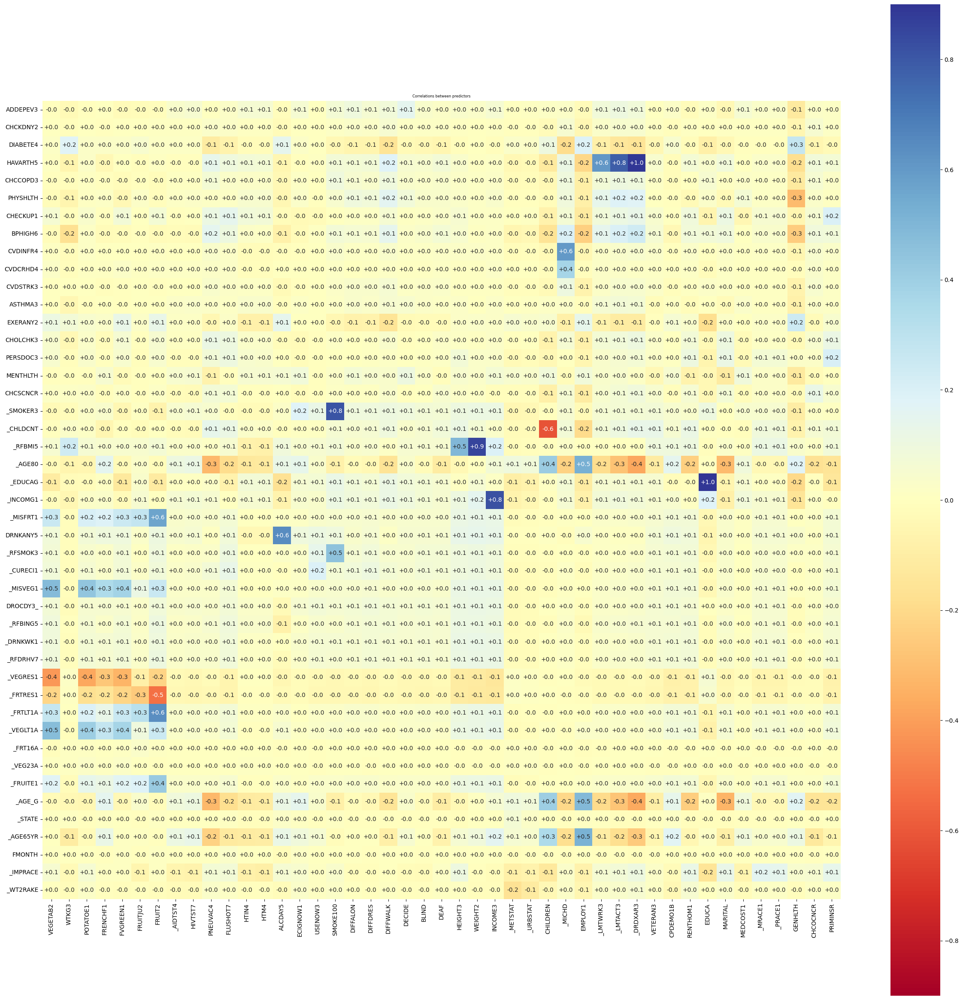

In [245]:
plt.figure(figsize=(30,30))
sns.heatmap(correlation_matrix.iloc[45:90,0:45], cmap="RdYlBu", 
    annot=True, square=True,
    vmin=-0.9, vmax=0.9, fmt="+.1f")
plt.title("Correlations between predictors", fontsize=6);
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

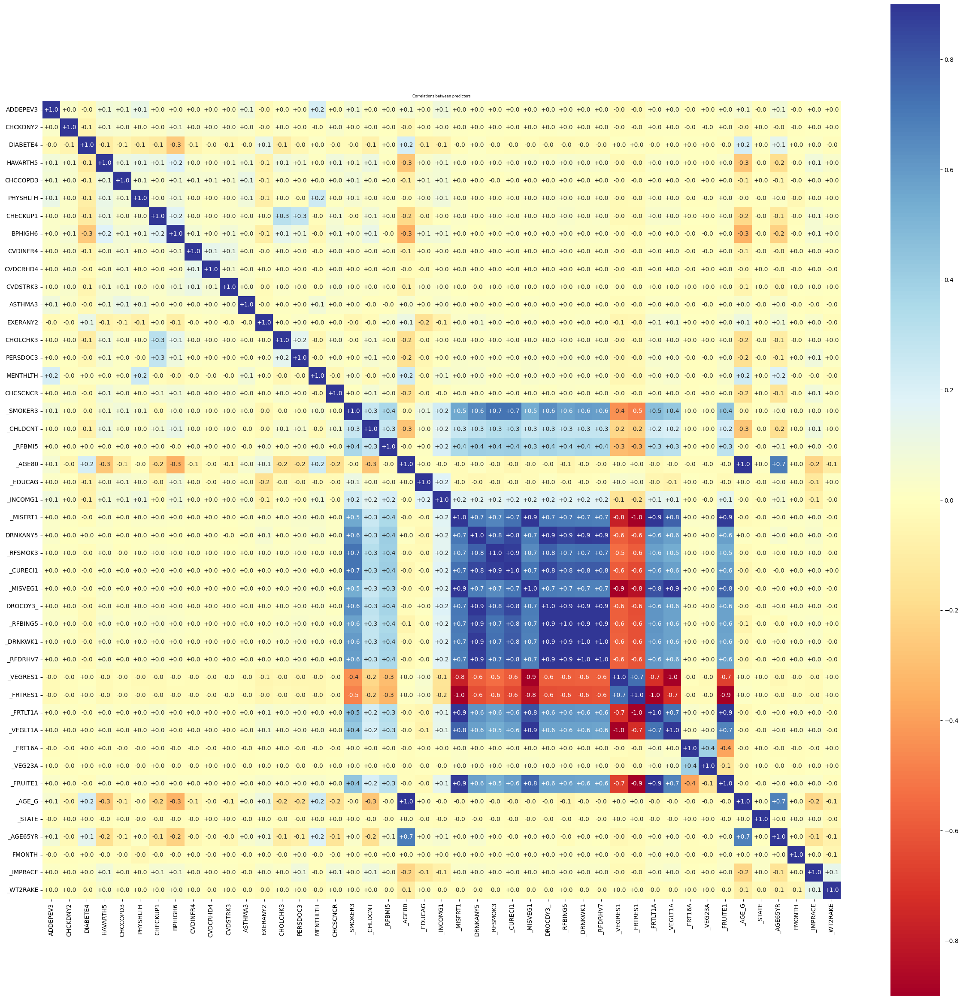

In [246]:
plt.figure(figsize=(30,30))
sns.heatmap(correlation_matrix.iloc[45:90,45:90], cmap="RdYlBu", 
    annot=True, square=True,
    vmin=-0.9, vmax=0.9, fmt="+.1f")
plt.title("Correlations between predictors", fontsize=6);
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

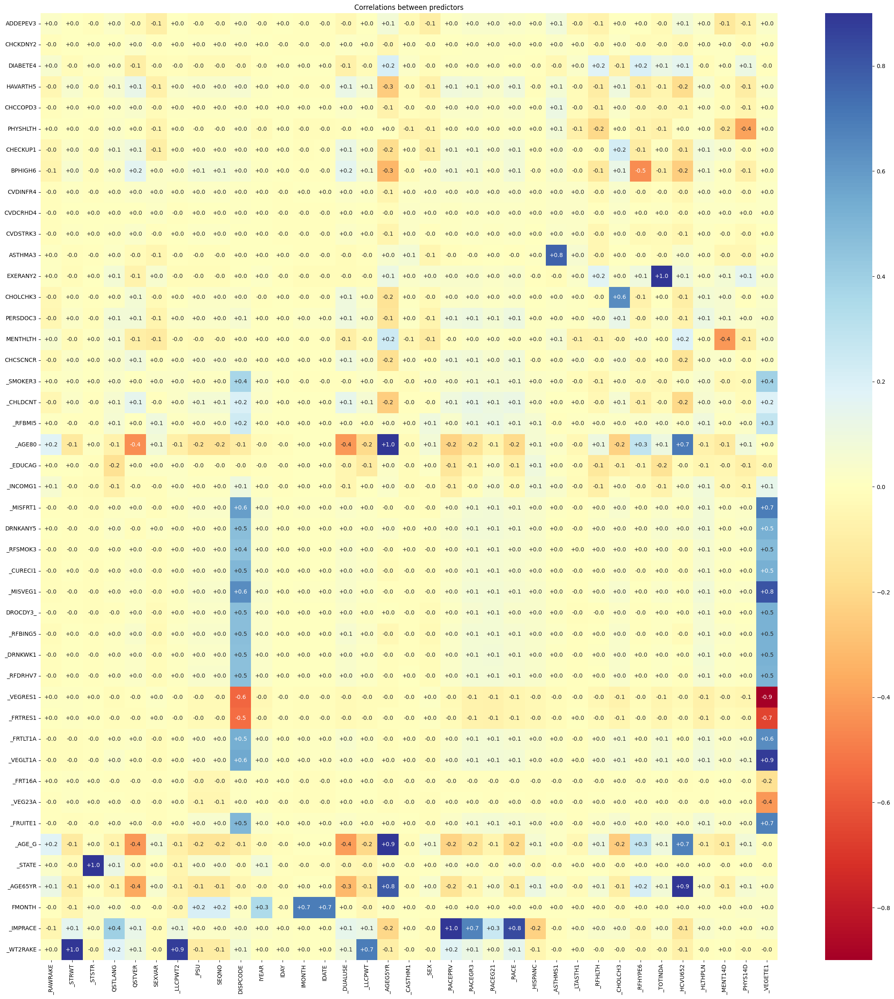

In [247]:
plt.figure(figsize=(30,30))
sns.heatmap(correlation_matrix.iloc[45:90,90:], cmap="RdYlBu", 
    annot=True, square=True,
    vmin=-0.9, vmax=0.9, fmt="+.1f")
plt.title("Correlations between predictors", fontsize=12);
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

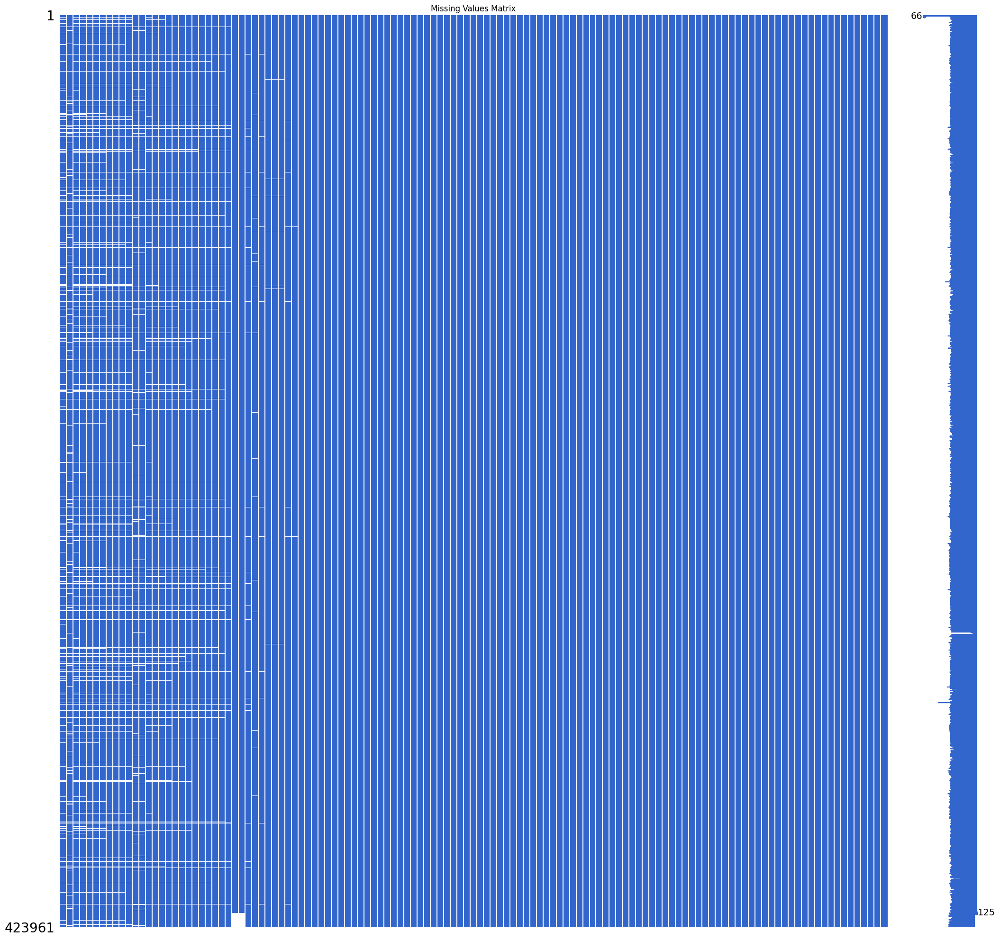

In [248]:
# Visualize missing values using missingno
msno.matrix(df_binary, figsize=(25, 25), color=(0.2, 0.4, 0.8))
plt.title('Missing Values Matrix', fontsize=12)
plt.show()

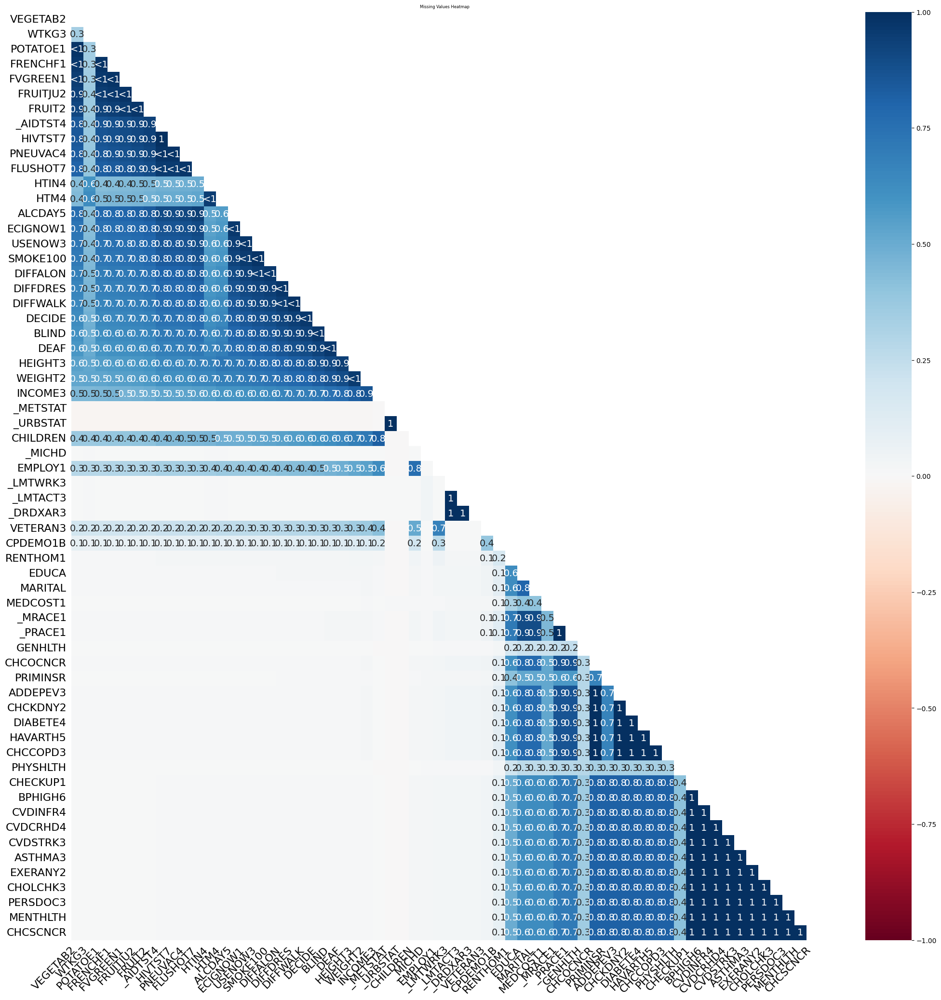

In [249]:
# Heatmap of missing values
msno.heatmap(df_binary, figsize=(25, 25))
plt.title('Missing Values Heatmap', fontsize=6)
plt.show()

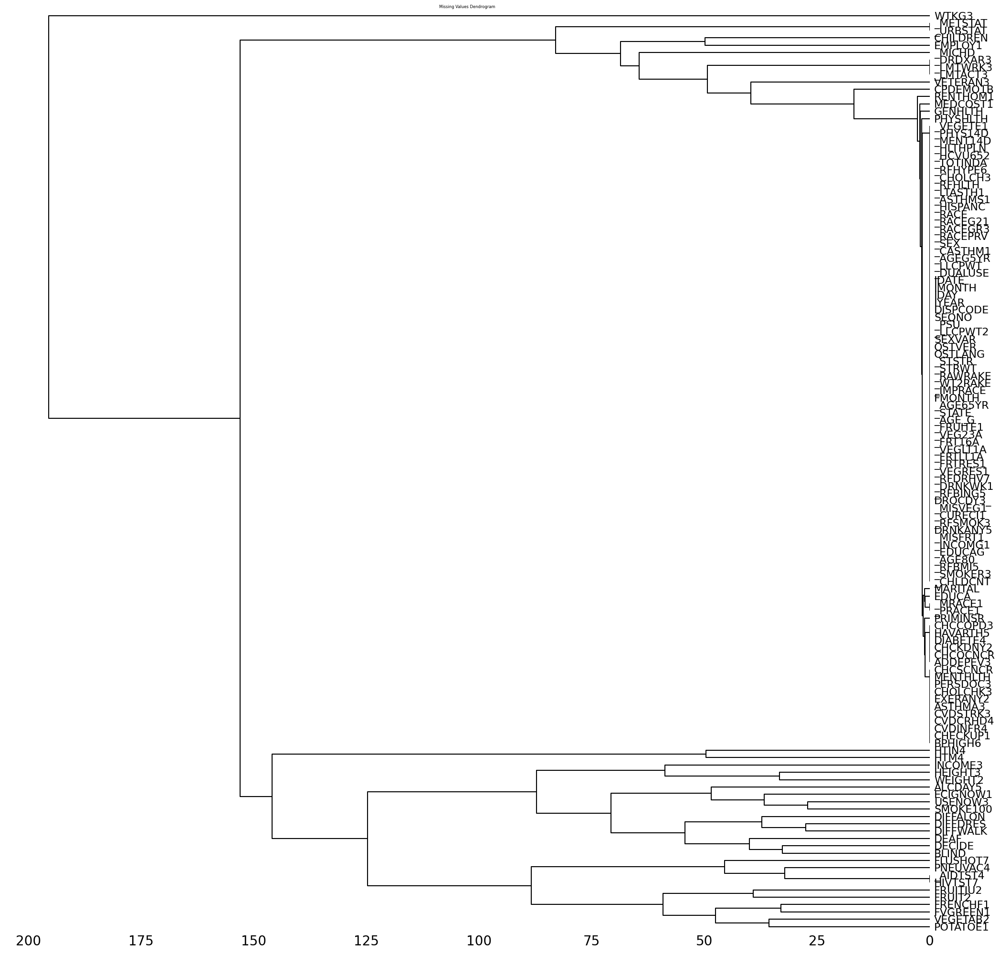

In [250]:
# Dendrogram of missing values
msno.dendrogram(df_binary, figsize=(25, 25))
plt.title('Missing Values Dendrogram', fontsize=6)
plt.show()

In [34]:
def figures_grid(nfigsx, nfigsy, figs_functions, figsize=None):
    if figsize is None:
        figsize = (nfigsx*3, nfigsy*3)
        
    fig = plt.figure(figsize=figsize)
    i = 1
    for y in range(1, nfigsy+1):
        for x in range(1,nfigsx+1):
            if i<=len(figs_functions):
                axis = fig.add_subplot(nfigsy, nfigsx, i)
                figs_functions[i-1]()
            i+=1

def plot_missing(col, target):
    
    def f1(): 
        if df[col].dtype==object:
            k = df[col].fillna("missing").value_counts()
            sns.barplot(x=k.index, y=k.values)
        else:
            sns.distplot(df[col].dropna())
        plt.title("distribution of %s"%col)
        plt.grid()
        
    def f2(): 
        if df[col].dtype==object:
            k=df[[col,target]].dropna()
            for v in df[col].dropna().unique():
                if sum(k[col]==v)>1:
                    sns.distplot(k[target][k[col]==v], 
                                 hist_kws=dict(alpha=.3), 
                                 kde_kws=dict(linewidth=1, alpha=.8),
                                 label=v);
            if sum(df[col].isna())>1:
                sns.distplot(df[target][df[col].isna()], 
                             hist_kws=dict(alpha=.8), 
                             kde_kws=dict(linewidth=1, alpha=1),
                             label="missing")
            plt.legend();
        else:
            plt.scatter(df[col], df[target], alpha=.5)
            plt.xlabel(target)
            plt.ylabel(col)
        plt.grid()
        plt.title("%s vs target"%(col))
        
    def f3(): 
        n = np.sum(df[col].isna())
        if n>1:
            sns.distplot(df[target][df[col].isna()], color="red",  hist_kws=dict(alpha=.3), label="missing (%d values)"%n)
        sns.distplot(df[target][~df[col].isna()], color="blue",  hist_kws=dict(alpha=.3), label="ok (%d values)"%(len(df)-n))
        plt.title("distribution of target wrt %s"%col)
        plt.yticks([])
        plt.grid()
        plt.legend()
        
    figures_grid(3,1, [f1, f2, f3], figsize=(20,3))

In [35]:
k = df_binary.isna().sum()
k[k!=0]

CHOLMED3    59833
_RFCHOL3    59430
TOLDHI3     59122
_VEGESU1    58089
_FRUTSU1    49376
VEGEDA2_    46958
POTADA1_    46856
_BMI5CAT    45032
_BMI5       45032
FRNCHDA_    43346
FTJUDA2_    42904
GRENDA1_    42804
FRUTDA2_    42513
VEGETAB2    39451
WTKG3       39082
POTATOE1    38179
FRENCHF1    37020
FVGREEN1    35934
FRUITJU2    34735
FRUIT2      33203
_AIDTST4    29306
HIVTST7     29306
PNEUVAC4    28272
FLUSHOT7    26863
HTIN4       26045
HTM4        23586
ALCDAY5     23797
ECIGNOW1    22374
USENOW3     21371
SMOKE100    20636
DIFFALON    19292
DIFFDRES    18254
DIFFWALK    17499
DECIDE      16368
BLIND       15298
DEAF        14193
HEIGHT3     12590
WEIGHT2     11477
INCOME3      8581
_METSTAT     6685
_URBSTAT     6685
CHILDREN     5949
_MICHD       4070
EMPLOY1      3472
_LMTWRK3     2419
_LMTACT3     2419
_DRDXAR3     2419
VETERAN3     1579
CPDEMO1B      281
RENTHOM1        8
EDUCA           5
MARITAL         5
MEDCOST1        5
_MRACE1         4
_PRACE1         4
GENHLTH   

In [36]:
vars = list(k[k!=0].index)
df[vars].dtypes

CHOLMED3    float64
_RFCHOL3    float64
TOLDHI3     float64
_VEGESU1    float64
_FRUTSU1    float64
VEGEDA2_    float64
POTADA1_    float64
_BMI5CAT    float64
_BMI5       float64
FRNCHDA_    float64
FTJUDA2_    float64
GRENDA1_    float64
FRUTDA2_    float64
VEGETAB2    float64
WTKG3       float64
POTATOE1    float64
FRENCHF1    float64
FVGREEN1    float64
FRUITJU2    float64
FRUIT2      float64
_AIDTST4    float64
HIVTST7     float64
PNEUVAC4    float64
FLUSHOT7    float64
HTIN4       float64
HTM4        float64
ALCDAY5     float64
ECIGNOW1    float64
USENOW3     float64
SMOKE100    float64
DIFFALON    float64
DIFFDRES    float64
DIFFWALK    float64
DECIDE      float64
BLIND       float64
DEAF        float64
HEIGHT3     float64
WEIGHT2     float64
INCOME3     float64
_METSTAT    float64
_URBSTAT    float64
CHILDREN    float64
_MICHD      float64
EMPLOY1     float64
_LMTWRK3    float64
_LMTACT3    float64
_DRDXAR3    float64
VETERAN3    float64
CPDEMO1B    float64
RENTHOM1    float64


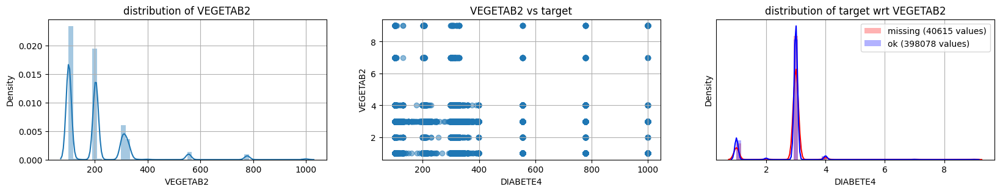

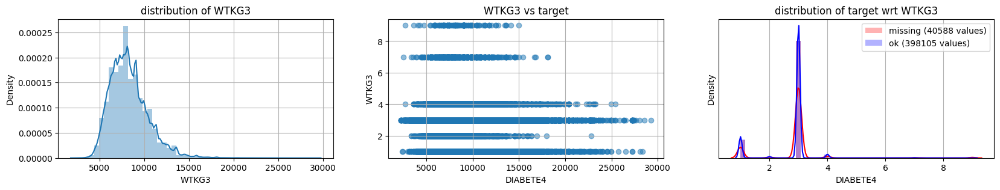

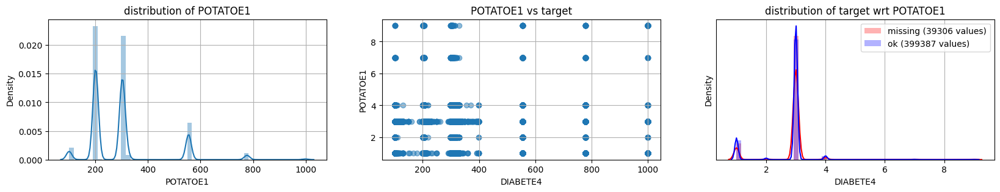

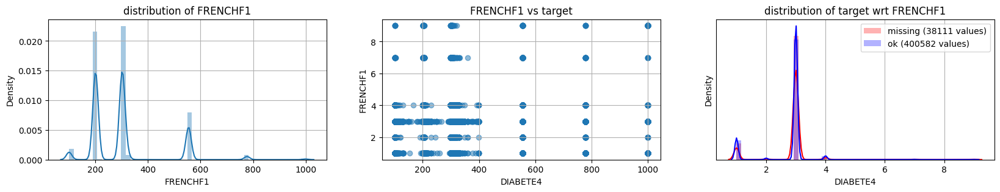

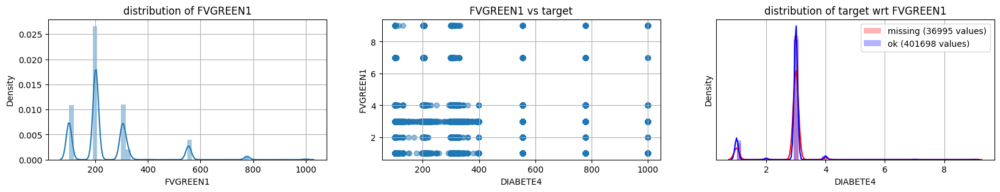

...

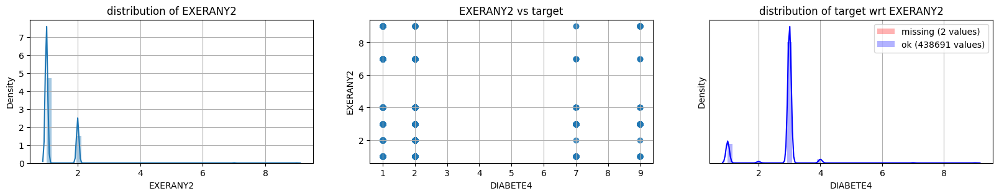

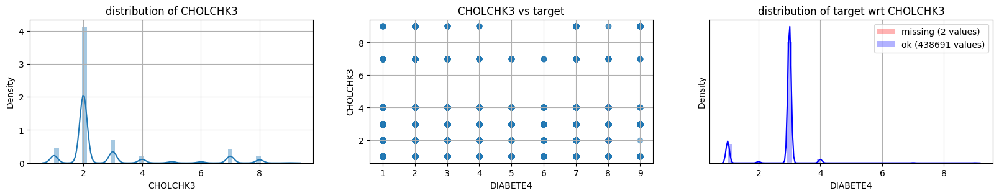

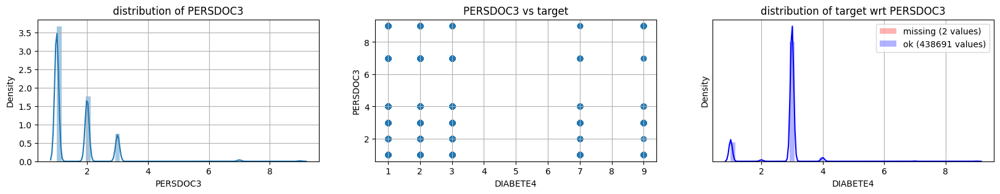

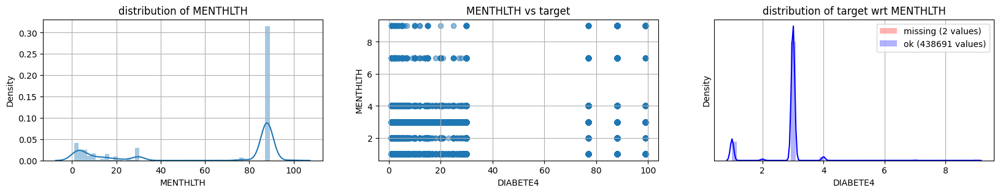

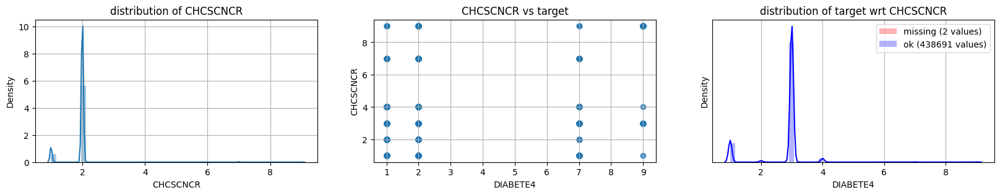

In [254]:
for col in vars:
    plot_missing(col, target="DIABETE4")

In [37]:
def plot_missing(col, target):
    
    def f1(): 
        if df_binary_cat[col].dtype==object:
            k = df_binary_cat[col].fillna("missing").value_counts()
            sns.barplot(x=k.index, y=k.values)
        else:
            sns.distplot(df_binary_cat[col].dropna())
        plt.title("distribution of %s"%col)
        plt.grid()
        
    def f2(): 
        if df_binary_cat[col].dtype==object:
            k=df_binary_cat[[col,target]].dropna()
            for v in df_binary_cat[col].dropna().unique():
                if sum(k[col]==v)>1:
                    sns.distplot(k[target][k[col]==v], 
                                 hist_kws=dict(alpha=.3), 
                                 kde_kws=dict(linewidth=1, alpha=.8),
                                 label=v);
            if sum(df[col].isna())>1:
                sns.distplot(df_binary_cat[target][df_binary_cat[col].isna()], 
                             hist_kws=dict(alpha=.8), 
                             kde_kws=dict(linewidth=1, alpha=1),
                             label="missing")
            plt.legend();
        else:
            plt.scatter(df_binary_cat[col], df_binary_cat[target], alpha=.5)
            plt.xlabel(target)
            plt.ylabel(col)
        plt.grid()
        plt.title("%s vs target"%(col))
        
    def f3(): 
        n = np.sum(df[col].isna())
        if n>1:
            sns.distplot(df_binary_cat[target][df_binary_cat[col].isna()], color="red",  hist_kws=dict(alpha=.3), label="missing (%d values)"%n)
        sns.distplot(df_binary_cat[target][~df_binary_cat[col].isna()], color="blue",  hist_kws=dict(alpha=.3), label="ok (%d values)"%(len(df)-n))
        plt.title("distribution of target wrt %s"%col)
        plt.yticks([])
        plt.grid()
        plt.legend()
        
    figures_grid(3,1, [f1, f2, f3], figsize=(20,3))

In [38]:
k = df_binary_cat.isna().sum()
k[k!=0]

CHOLMED3    59833
_RFCHOL3    59430
TOLDHI3     59122
_VEGESU1    58089
_FRUTSU1    49376
VEGEDA2_    46958
POTADA1_    46856
_BMI5CAT    45032
_BMI5       45032
FRNCHDA_    43346
FTJUDA2_    42904
GRENDA1_    42804
FRUTDA2_    42513
VEGETAB2    39451
WTKG3       39082
POTATOE1    38179
FRENCHF1    37020
FVGREEN1    35934
FRUITJU2    34735
FRUIT2      33203
_AIDTST4    29306
HIVTST7     29306
PNEUVAC4    28272
FLUSHOT7    26863
HTIN4       26045
HTM4        23586
ALCDAY5     23797
ECIGNOW1    22374
USENOW3     21371
SMOKE100    20636
DIFFALON    19292
DIFFDRES    18254
DIFFWALK    17499
DECIDE      16368
BLIND       15298
DEAF        14193
HEIGHT3     12590
WEIGHT2     11477
INCOME3      8581
_METSTAT     6685
_URBSTAT     6685
CHILDREN     5949
_MICHD       4070
EMPLOY1      3472
_LMTWRK3     2419
_LMTACT3     2419
_DRDXAR3     2419
VETERAN3     1579
CPDEMO1B      281
RENTHOM1        8
EDUCA           5
MARITAL         5
MEDCOST1        5
_MRACE1         4
_PRACE1         4
GENHLTH   

In [39]:
vars = list(k[k!=0].index)
#vars.remove('fiSecondaryDesc')
#vars.remove('fiModelSeries')
#vars.remove('fiModelDescriptor')

df[vars].dtypes

CHOLMED3    float64
_RFCHOL3    float64
TOLDHI3     float64
_VEGESU1    float64
_FRUTSU1    float64
VEGEDA2_    float64
POTADA1_    float64
_BMI5CAT    float64
_BMI5       float64
FRNCHDA_    float64
FTJUDA2_    float64
GRENDA1_    float64
FRUTDA2_    float64
VEGETAB2    float64
WTKG3       float64
POTATOE1    float64
FRENCHF1    float64
FVGREEN1    float64
FRUITJU2    float64
FRUIT2      float64
_AIDTST4    float64
HIVTST7     float64
PNEUVAC4    float64
FLUSHOT7    float64
HTIN4       float64
HTM4        float64
ALCDAY5     float64
ECIGNOW1    float64
USENOW3     float64
SMOKE100    float64
DIFFALON    float64
DIFFDRES    float64
DIFFWALK    float64
DECIDE      float64
BLIND       float64
DEAF        float64
HEIGHT3     float64
WEIGHT2     float64
INCOME3     float64
_METSTAT    float64
_URBSTAT    float64
CHILDREN    float64
_MICHD      float64
EMPLOY1     float64
_LMTWRK3    float64
_LMTACT3    float64
_DRDXAR3    float64
VETERAN3    float64
CPDEMO1B    float64
RENTHOM1    float64


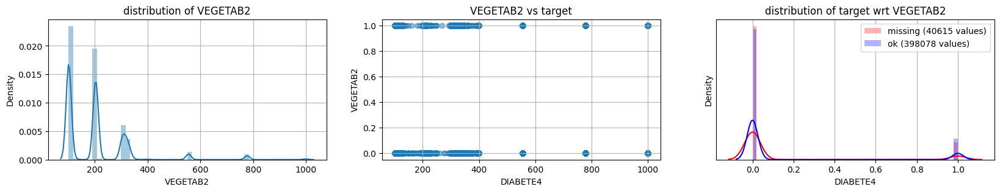

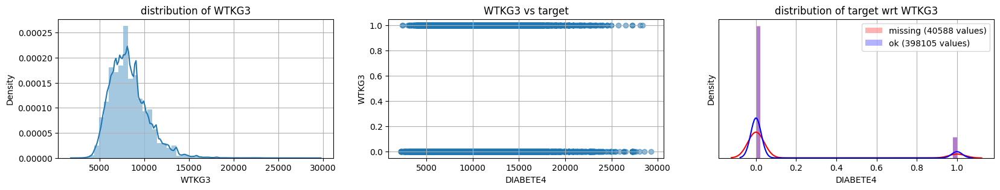

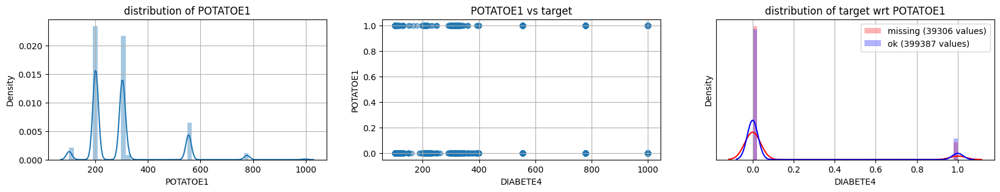

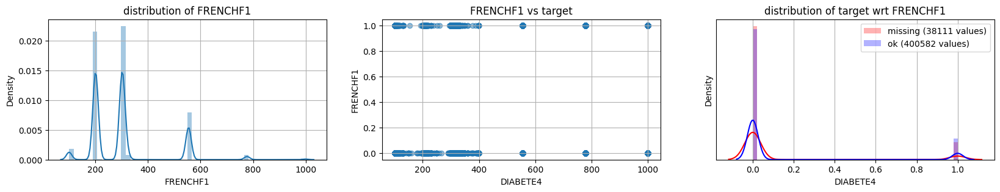

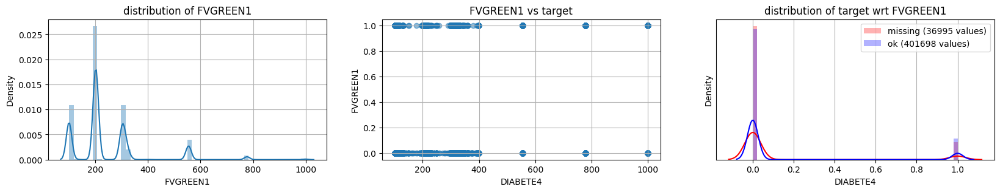

...

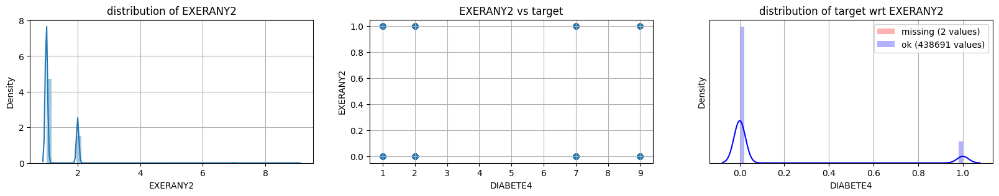

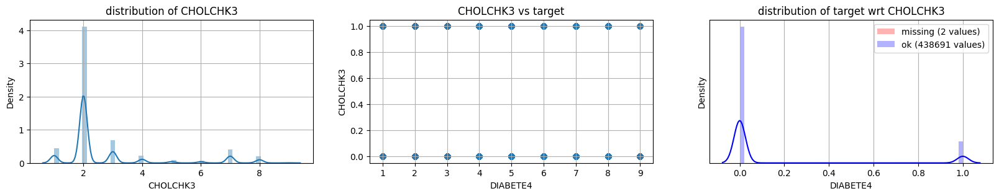

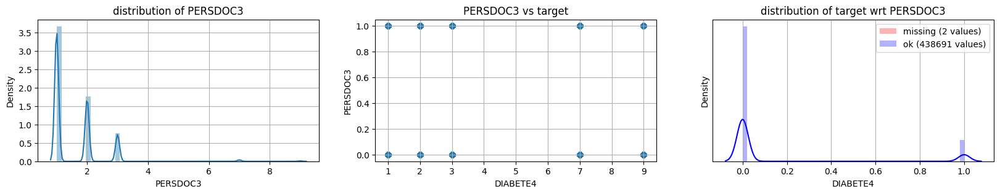

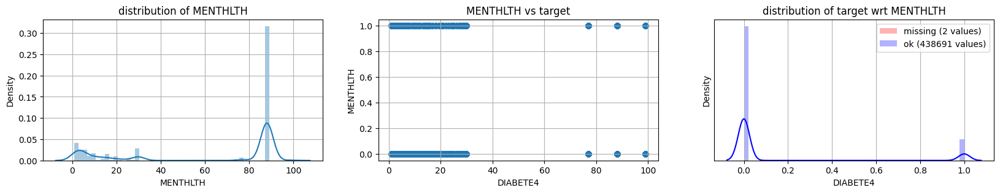

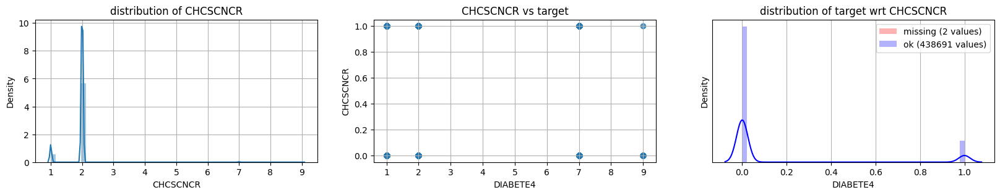

In [258]:
for col in vars:
    plot_missing(col, target="DIABETE4")

In [40]:
df_binary.dtypes

CHOLMED3    float64
_RFCHOL3    float64
TOLDHI3     float64
_VEGESU1    float64
_FRUTSU1    float64
VEGEDA2_    float64
POTADA1_    float64
_BMI5CAT    float64
_BMI5       float64
FRNCHDA_    float64
FTJUDA2_    float64
GRENDA1_    float64
FRUTDA2_    float64
VEGETAB2    float64
WTKG3       float64
POTATOE1    float64
FRENCHF1    float64
FVGREEN1    float64
FRUITJU2    float64
FRUIT2      float64
_AIDTST4    float64
HIVTST7     float64
PNEUVAC4    float64
FLUSHOT7    float64
HTIN4       float64
HTM4        float64
ALCDAY5     float64
ECIGNOW1    float64
USENOW3     float64
SMOKE100    float64
DIFFALON    float64
DIFFDRES    float64
DIFFWALK    float64
DECIDE      float64
BLIND       float64
DEAF        float64
HEIGHT3     float64
WEIGHT2     float64
INCOME3     float64
_METSTAT    float64
_URBSTAT    float64
CHILDREN    float64
_MICHD      float64
EMPLOY1     float64
_LMTWRK3    float64
_LMTACT3    float64
_DRDXAR3    float64
VETERAN3    float64
CPDEMO1B    float64
RENTHOM1    float64


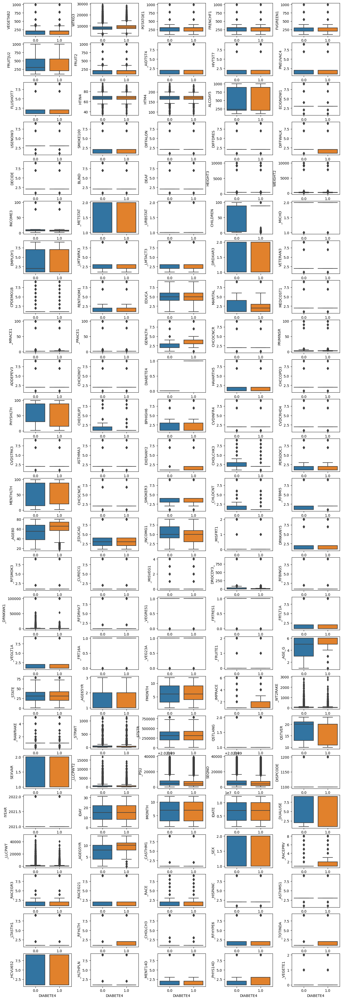

In [260]:
# Histogram for numerical features
fig, ax = plt.subplots(25, 5, figsize=(16,50))

for i in range(0, (len(ax.flatten()))):
    sns.boxplot(x="DIABETE4",y=df_binary.columns[i],data=df_binary, ax=ax[int(i/5),i % 5])

# Adjust the vertical spacing between subplots    
plt.subplots_adjust(wspace=0.4)  

plt.show()

In [41]:
features_selected = ['DIABETE4', '_RFHYPE6', 'TOLDHI3', '_CHOLCH3', '_BMI5', 'SMOKE100', 'CVDSTRK3', '_MICHD',
                    '_TOTINDA', '_FRTLT1A', '_VEGLT1A', '_RFDRHV7', '_HLTHPLN', 'MEDCOST1', 'GENHLTH', 'MENTHLTH', 'PHYSHLTH',
                    'DIFFWALK', '_SEX', '_AGEG5YR', 'EDUCA', 'INCOME3']

In [42]:
cols_set = set(list(df_binary.columns))

In [43]:
cols_selected = set(features_selected)

In [44]:
cols_selected - cols_set

set()

In [45]:
df_train = df_binary.copy()
df_train = df_train[features_selected]

In [46]:
# Number of unique values in each column of training data
unique_val_count_by_column = (df_train.nunique())
print(unique_val_count_by_column[unique_val_count_by_column > 0])

DIABETE4       2
_RFHYPE6       3
TOLDHI3        4
_CHOLCH3       4
_BMI5       3843
SMOKE100       4
CVDSTRK3       4
_MICHD         2
_TOTINDA       3
_FRTLT1A       3
_VEGLT1A       3
_RFDRHV7       3
_HLTHPLN       3
MEDCOST1       4
GENHLTH        7
MENTHLTH      33
PHYSHLTH      33
DIFFWALK       4
_SEX           2
_AGEG5YR      14
EDUCA          7
INCOME3       13
dtype: int64


Based on the codebook (data dictionary), predominantly categorical variables were re-encoded to separate non surveyed values and also to be able to represent in a proper manner ordinal categorical varibales

In [48]:
# Re-assigning indeterminate survey categories to values not in near intersection with real values for different features
df_train['_RFHYPE6'] = df_train['_RFHYPE6'].replace({1:0, 2:1, 9:pd.NA})
df_train['TOLDHI3'] = df_train['TOLDHI3'].replace({1:0, 2:1, 9:pd.NA})
df_train['_CHOLCH3'] = df_train['_CHOLCH3'].replace({9:pd.NA})
df_train['SMOKE100'] = df_train['SMOKE100'].replace({4:0, 3:1, 2:2, 1:3, 7:-999, 9:pd.NA})
df_train['CVDSTRK3'] = df_train['CVDSTRK3'].replace({1:1, 2:0, 7:pd.NA, 9:pd.NA})
df_train['_MICHD'] = df_train['_MICHD'].replace({1:1, 2:0})
df_train['_TOTINDA'] = df_train['_TOTINDA'].replace({1:1, 2:0, 9:pd.NA})
df_train['_FRTLT1A'] = df_train['_FRTLT1A'].replace({1:1, 2:0, 9:pd.NA})
df_train['_VEGLT1A'] = df_train['_VEGLT1A'].replace({1:1, 2:0, 9:pd.NA})
df_train['_RFDRHV7'] = df_train['_RFDRHV7'].replace({1:0, 2:1, 9:pd.NA})
df_train['_HLTHPLN'] = df_train['_HLTHPLN'].replace({1:1, 2:0, 9:pd.NA})
df_train['MEDCOST1'] = df_train['MEDCOST1'].replace({1:1, 2:0, 7:pd.NA, 9:pd.NA})
df_train['GENHLTH'] = df_train['GENHLTH'].replace({7:pd.NA, 9:pd.NA})
df_train['DIFFWALK'] = df_train['DIFFWALK'].replace({1:1, 2:0, 7:pd.NA, 9:pd.NA})
df_train['_SEX'] = df_train['_SEX'].replace({1:1, 2:0})
df_train['_AGEG5YR'] = df_train['_AGEG5YR'].replace({14:pd.NA})
df_train['EDUCA'] = df_train['EDUCA'].replace({9:pd.NA})
df_train['INCOME3'] = df_train['INCOME3'].replace({77:pd.NA, 9:pd.NA})

In [49]:
df_train.isna().sum()

DIABETE4        3
_RFHYPE6     1604
TOLDHI3     59474
_CHOLCH3    28739
_BMI5       45032
SMOKE100    21410
CVDSTRK3     1063
_MICHD       4070
_TOTINDA      796
_FRTLT1A    49376
_VEGLT1A    58089
_RFDRHV7    33825
_HLTHPLN    16761
MEDCOST1     1211
GENHLTH      1050
MENTHLTH        2
PHYSHLTH        3
DIFFWALK    19108
_SEX            0
_AGEG5YR     9134
EDUCA        2261
INCOME3     89710
dtype: int64

In [50]:
df_train.dropna(inplace=True)
df_train.shape

(220994, 22)

In [51]:
df_train.isna().sum()

DIABETE4    0
_RFHYPE6    0
TOLDHI3     0
_CHOLCH3    0
_BMI5       0
SMOKE100    0
CVDSTRK3    0
_MICHD      0
_TOTINDA    0
_FRTLT1A    0
_VEGLT1A    0
_RFDRHV7    0
_HLTHPLN    0
MEDCOST1    0
GENHLTH     0
MENTHLTH    0
PHYSHLTH    0
DIFFWALK    0
_SEX        0
_AGEG5YR    0
EDUCA       0
INCOME3     0
dtype: int64

In [52]:
categorical_cols = [cname for cname in df_train.columns if df_binary[cname].nunique() < 15]
categorical_cols

['DIABETE4',
 '_RFHYPE6',
 'TOLDHI3',
 '_CHOLCH3',
 'SMOKE100',
 'CVDSTRK3',
 '_MICHD',
 '_TOTINDA',
 '_FRTLT1A',
 '_VEGLT1A',
 '_RFDRHV7',
 '_HLTHPLN',
 'MEDCOST1',
 'GENHLTH',
 'DIFFWALK',
 '_SEX',
 '_AGEG5YR',
 'EDUCA',
 'INCOME3']

In [53]:
categorical_cols

['DIABETE4',
 '_RFHYPE6',
 'TOLDHI3',
 '_CHOLCH3',
 'SMOKE100',
 'CVDSTRK3',
 '_MICHD',
 '_TOTINDA',
 '_FRTLT1A',
 '_VEGLT1A',
 '_RFDRHV7',
 '_HLTHPLN',
 'MEDCOST1',
 'GENHLTH',
 'DIFFWALK',
 '_SEX',
 '_AGEG5YR',
 'EDUCA',
 'INCOME3']

In [54]:
categorical_cols.remove('DIABETE4')
df_train[categorical_cols] =  df_train[categorical_cols].astype(str)
df_train.dtypes

DIABETE4    float64
_RFHYPE6     object
TOLDHI3      object
_CHOLCH3     object
_BMI5       float64
SMOKE100     object
CVDSTRK3     object
_MICHD       object
_TOTINDA     object
_FRTLT1A     object
_VEGLT1A     object
_RFDRHV7     object
_HLTHPLN     object
MEDCOST1     object
GENHLTH      object
MENTHLTH    float64
PHYSHLTH    float64
DIFFWALK     object
_SEX         object
_AGEG5YR     object
EDUCA        object
INCOME3      object
dtype: object

In [55]:
ordinal_cats = ['_AGEG5YR', 'EDUCA', 'INCOME3']
nominal_cats = [cat for cat in categorical_cols if cat not in ordinal_cats]

In [56]:
numerical_cols = [cname for cname in df_train.columns if df_train[cname].dtype in ['int64', 'float']]
numerical_cols

['DIABETE4', '_BMI5', 'MENTHLTH', 'PHYSHLTH']

In [57]:
#df_train = df_train.dropna()
df_train.shape

(220994, 22)

In [58]:
df_train.isna().sum()

DIABETE4    0
_RFHYPE6    0
TOLDHI3     0
_CHOLCH3    0
_BMI5       0
SMOKE100    0
CVDSTRK3    0
_MICHD      0
_TOTINDA    0
_FRTLT1A    0
_VEGLT1A    0
_RFDRHV7    0
_HLTHPLN    0
MEDCOST1    0
GENHLTH     0
MENTHLTH    0
PHYSHLTH    0
DIFFWALK    0
_SEX        0
_AGEG5YR    0
EDUCA       0
INCOME3     0
dtype: int64

### 2 Train-Test Splitting

In [59]:
from sklearn.model_selection import train_test_split

df_train_full, df_test = train_test_split(df_train, test_size=0.2, random_state=1)
df_trainx, df_val = train_test_split(df_train_full, test_size=0.25, random_state=1)


In [60]:
print(df_train_full.shape), print(df_trainx.shape), print(df_val.shape), print(df_test.shape)

(176795, 22)
(132596, 22)
(44199, 22)
(44199, 22)


(None, None, None, None)

In [68]:
y_train = df_trainx.DIABETE4.values
y_val = df_val.DIABETE4.values.astype(int)

In [69]:
y_val

array([0, 0, 0, ..., 0, 0, 0])

In [70]:
del df_trainx['DIABETE4']
del df_val['DIABETE4']

In [71]:
print(df_trainx.shape), print(df_val.shape)

(132596, 21)
(44199, 21)


(None, None)

### 2.1 Mutual Information Scores

In [72]:
def make_mi_scores(X, y):
    X = X.copy()
    for colname in X.select_dtypes(["object", "category"]):
        X[colname], _ = X[colname].factorize()
    # All discrete features should now have integer dtypes
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in X.dtypes]
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features, random_state=0)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores


def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

In [73]:
from sklearn.feature_selection import mutual_info_regression

mi_scores = make_mi_scores(df_trainx, y_train)

GENHLTH     0.040054
_RFHYPE6    0.038277
_AGEG5YR    0.027319
_BMI5       0.024008
TOLDHI3     0.023534
DIFFWALK    0.020701
PHYSHLTH    0.014632
_MICHD      0.013993
INCOME3     0.013900
EDUCA       0.013437
_TOTINDA    0.011127
_CHOLCH3    0.005715
CVDSTRK3    0.005168
_VEGLT1A    0.004369
SMOKE100    0.004027
_RFDRHV7    0.003180
_HLTHPLN    0.002268
MEDCOST1    0.001566
MENTHLTH    0.000815
_FRTLT1A    0.000769
Name: MI Scores, dtype: float64


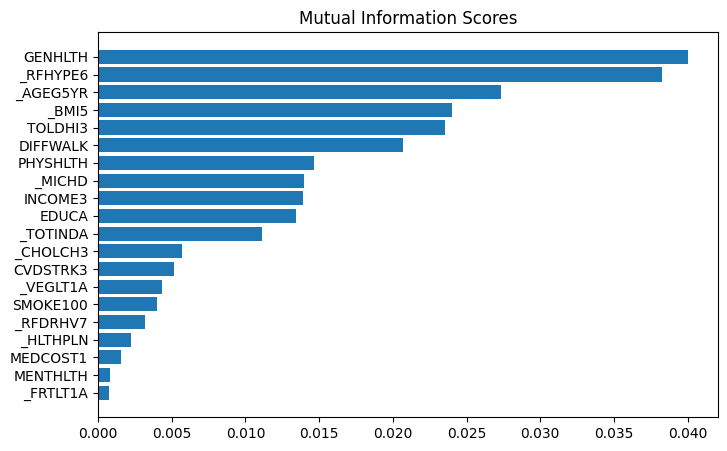

In [74]:
print(mi_scores.head(20))

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores.head(20))

### 2.3 Oversampling with Random Sampler

In [75]:
print("Proportion of True data in original data is {:.2%}".format(len(y_train[y_train==1])/len(y_train)))
print("Proportion of False data in original data is {:.2%}".format(len(y_train[y_train==0])/len(y_train)))

Proportion of True data in original data is 15.63%
Proportion of False data in original data is 84.37%


In [76]:
(y_train == 1).sum()

20723

In [77]:
y_train = y_train.astype(np.int64)
y_train

array([1, 0, 0, ..., 1, 0, 0])

In [78]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_train_over, y_train_over = over_sampler.fit_resample(df_trainx, y_train)
X_train_over.tail()

,_RFHYPE6,TOLDHI3,_CHOLCH3,_BMI5,SMOKE100,CVDSTRK3,_MICHD,_TOTINDA,_FRTLT1A,_VEGLT1A,_RFDRHV7,_HLTHPLN,MEDCOST1,GENHLTH,MENTHLTH,PHYSHLTH,DIFFWALK,_SEX,_AGEG5YR,EDUCA,INCOME3
223741,1,0.0,1,2848.0,2.0,0.0,0.0,1,1,1,0,1,0.0,3.0,88.0,88.0,0.0,1,10,6.0,8.0
223742,1,0.0,1,4190.0,3.0,0.0,1.0,1,0,1,0,1,0.0,3.0,88.0,88.0,0.0,1,9,4.0,99.0
223743,0,0.0,1,2048.0,3.0,0.0,0.0,0,0,1,0,1,0.0,4.0,28.0,88.0,1.0,0,7,5.0,6.0
223744,1,1.0,1,2889.0,2.0,0.0,0.0,1,1,1,0,1,0.0,2.0,88.0,88.0,0.0,0,9,6.0,6.0
223745,1,0.0,1,2566.0,2.0,0.0,0.0,1,1,1,0,1,0.0,4.0,4.0,88.0,0.0,0,3,5.0,5.0


In [79]:
X_train_over.isna().sum()

_RFHYPE6    0
TOLDHI3     0
_CHOLCH3    0
_BMI5       0
SMOKE100    0
CVDSTRK3    0
_MICHD      0
_TOTINDA    0
_FRTLT1A    0
_VEGLT1A    0
_RFDRHV7    0
_HLTHPLN    0
MEDCOST1    0
GENHLTH     0
MENTHLTH    0
PHYSHLTH    0
DIFFWALK    0
_SEX        0
_AGEG5YR    0
EDUCA       0
INCOME3     0
dtype: int64

In [80]:
print("Proportion of True data in original data is {:.2%}".format(len(y_train[y_train==1])/len(y_train)))
print("Proportion of False data in original data is {:.2%}".format(len(y_train[y_train==0])/len(y_train)))
print("length of oversampled data is ",len(X_train_over))
print("Proportion of True data in oversampled data is {:.2%}".format(len(y_train_over[y_train_over ==1])/len(y_train_over)))
print("Proportion of False data in oversampled data is {:.2%}".format(len(y_train_over[y_train_over ==0])/len(y_train_over)))

Proportion of True data in original data is 15.63%
Proportion of False data in original data is 84.37%
length of oversampled data is  223746
Proportion of True data in oversampled data is 50.00%
Proportion of False data in oversampled data is 50.00%


In [81]:
X_train_over[categorical_cols] =  X_train_over[categorical_cols].astype(str)

### 2.3 One-Hot Encoding

In [82]:
train_dict = X_train_over.to_dict(orient='records')

In [83]:
train_dict[0]

{'_RFHYPE6': '1',
 'TOLDHI3': '0.0',
 '_CHOLCH3': '1',
 '_BMI5': 2428.0,
 'SMOKE100': '3.0',
 'CVDSTRK3': '0.0',
 '_MICHD': '1.0',
 '_TOTINDA': '1',
 '_FRTLT1A': '1',
 '_VEGLT1A': '1',
 '_RFDRHV7': '0',
 '_HLTHPLN': '1',
 'MEDCOST1': '1.0',
 'GENHLTH': '3.0',
 'MENTHLTH': 88.0,
 'PHYSHLTH': 7.0,
 'DIFFWALK': '0.0',
 '_SEX': '1',
 '_AGEG5YR': '11',
 'EDUCA': '6.0',
 'INCOME3': '7.0'}

In [84]:
dv = DictVectorizer(sparse=False)
dv.fit(train_dict)

DictVectorizer(sparse=False)

In [85]:
X_train = dv.transform(train_dict)

In [86]:
X_train[-5:,:]

array([[1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 8.800e+01, 8.800e+01,
        0.000e+00, 1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 2.848e+03, 1.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 1.000e+00, 1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 1.000e+00],
       [1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
       

In [87]:
dv.feature_names_

['CVDSTRK3=0.0',
 'CVDSTRK3=1.0',
 'DIFFWALK=0.0',
 'DIFFWALK=1.0',
 'EDUCA=1.0',
 'EDUCA=2.0',
 'EDUCA=3.0',
 'EDUCA=4.0',
 'EDUCA=5.0',
 'EDUCA=6.0',
 'GENHLTH=1.0',
 'GENHLTH=2.0',
 'GENHLTH=3.0',
 'GENHLTH=4.0',
 'GENHLTH=5.0',
 'INCOME3=1.0',
 'INCOME3=10.0',
 'INCOME3=11.0',
 'INCOME3=2.0',
 'INCOME3=3.0',
 'INCOME3=4.0',
 'INCOME3=5.0',
 'INCOME3=6.0',
 'INCOME3=7.0',
 'INCOME3=8.0',
 'INCOME3=99.0',
 'MEDCOST1=0.0',
 'MEDCOST1=1.0',
 'MENTHLTH',
 'PHYSHLTH',
 'SMOKE100=-999.0',
 'SMOKE100=2.0',
 'SMOKE100=3.0',
 'TOLDHI3=0.0',
 'TOLDHI3=1.0',
 'TOLDHI3=7.0',
 '_AGEG5YR=1',
 '_AGEG5YR=10',
 '_AGEG5YR=11',
 '_AGEG5YR=12',
 '_AGEG5YR=13',
 '_AGEG5YR=2',
 '_AGEG5YR=3',
 '_AGEG5YR=4',
 '_AGEG5YR=5',
 '_AGEG5YR=6',
 '_AGEG5YR=7',
 '_AGEG5YR=8',
 '_AGEG5YR=9',
 '_BMI5',
 '_CHOLCH3=1',
 '_CHOLCH3=2',
 '_FRTLT1A=0',
 '_FRTLT1A=1',
 '_HLTHPLN=0',
 '_HLTHPLN=1',
 '_MICHD=0.0',
 '_MICHD=1.0',
 '_RFDRHV7=0',
 '_RFDRHV7=1',
 '_RFHYPE6=0',
 '_RFHYPE6=1',
 '_SEX=0',
 '_SEX=1',
 '_TOTINDA=0',
 

## 3 Model Training

### Logistic Regression

In [94]:
acc_baseline = pd.DataFrame(y_train_over).value_counts(normalize=True).max()
print('Baseline Accuracy: ', round(acc_baseline, 4))

Baseline Accuracy:  0.5


In [89]:
from sklearn.linear_model import LogisticRegression

In [90]:
model = LogisticRegression(solver='liblinear', random_state=1)
model.fit(X_train, y_train_over)

LogisticRegression(random_state=1, solver='liblinear')

In [ ]:
model_v2 = LogisticRegression(solver='liblinear', random_state=1)
model_v2.fit(df_trainx, y_train)

In [ ]:
val_dict = df_val.to_dict(orient='records')
X_val = dv.transform(val_dict)

In [ ]:
model.predict_proba(X_val)

In [ ]:
y_pred = model.predict_proba(X_val)[:, 1]
y_pred

In [ ]:
y_pred = model.predict(X_val)
y_pred

In [ ]:
(y_pred == y_val).mean()

In [92]:
model.intercept_[0]

-0.3497757604311943

In [93]:
dict(zip(dv.feature_names_, model.coef_[0].round(3)))

{'CVDSTRK3=0.0': -0.312,
 'CVDSTRK3=1.0': -0.038,
 'DIFFWALK=0.0': -0.216,
 'DIFFWALK=1.0': -0.134,
 'EDUCA=1.0': 0.024,
 'EDUCA=2.0': 0.173,
 'EDUCA=3.0': -0.083,
 'EDUCA=4.0': -0.167,
 'EDUCA=5.0': -0.088,
 'EDUCA=6.0': -0.208,
 'GENHLTH=1.0': -1.129,
 'GENHLTH=2.0': -0.541,
 'GENHLTH=3.0': 0.129,
 'GENHLTH=4.0': 0.607,
 'GENHLTH=5.0': 0.585,
 'INCOME3=1.0': 0.192,
 'INCOME3=10.0': -0.305,
 'INCOME3=11.0': -0.477,
 'INCOME3=2.0': 0.254,
 'INCOME3=3.0': 0.129,
 'INCOME3=4.0': 0.173,
 'INCOME3=5.0': 0.086,
 'INCOME3=6.0': -0.004,
 'INCOME3=7.0': -0.053,
 'INCOME3=8.0': -0.186,
 'INCOME3=99.0': -0.16,
 'MEDCOST1=0.0': -0.18,
 'MEDCOST1=1.0': -0.17,
 'MENTHLTH': 0.001,
 'PHYSHLTH': 0.0,
 'SMOKE100=-999.0': -0.06,
 'SMOKE100=2.0': -0.111,
 'SMOKE100=3.0': -0.179,
 'TOLDHI3=0.0': 0.129,
 'TOLDHI3=1.0': -0.439,
 'TOLDHI3=7.0': -0.04,
 '_AGEG5YR=1': -0.939,
 '_AGEG5YR=10': 0.533,
 '_AGEG5YR=11': 0.652,
 '_AGEG5YR=12': 0.655,
 '_AGEG5YR=13': 0.395,
 '_AGEG5YR=2': -0.887,
 '_AGEG5YR=3': -0.91,

### 3.2 XGBoost Model

In [85]:
# Parameter Setup
p_folds = 5
p_iter = 200
p_estimators = 200
p_learning_rate = 0.01

In [86]:
# A parameter grid for XGBoost
params = {
        'max_depth': randint(5, 10),
        'gamma': uniform(0.0, 0.5),
        'subsample': uniform(0.6, 1.0),
        'colsample_bytree': uniform(0.6, 1.0),
        'reg_alpha': uniform(0.0, 1.0),
        'reg_lambda': uniform(0.0, 1.0),
        'min_child_weight': randint(3, 7),
        'scale_pos_weight': randint(1, 10)     
        }

In [87]:
xgb = XGBClassifier(learning_rate=p_learning_rate, n_estimators = p_estimators, objective='binary:logistic', device='cuda')

In [88]:
folds = p_folds

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001)

xg_model = RandomizedSearchCV(xgb, param_distributions=params, n_iter=p_iter, scoring='roc_auc', n_jobs=-1, cv=skf.split(X_train,y_train_over), verbose=-1, random_state=1001 )

xg_model.fit(X_train, y_train_over)

/home/hydroinfmtk/mambaforge/envs/tf3x/lib/python3.8/site-packages/xgboost/core.py:160: UserWarning: [02:25:03] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)
/home/hydroinfmtk/mambaforge/envs/tf3x/lib/python3.8/site-packages/xgboost/core.py:160: UserWarning: [02:25:03] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the d

RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x7fdea605f510>,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device='cuda',
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_ty...
                                        'reg_alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7fdf90de7f10>,
                                        'reg_lambda': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7fdf90d76820>,
                                        'scale_pos_weight': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7fdf90de7f70>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7fdf90dd2490>},
                   random_state=1001, scoring='roc_auc', verbose=-1)

In [89]:
print(xg_model.best_estimator_)
print(xg_model.best_params_)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8520519183217274, device='cuda',
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.3342007644918499,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)
{'colsample_bytree': 0.8520519183217274, 'gamma': 0.3342007644918499, 'max_depth': 9, 'min_child_weight': 4, 'reg_alpha': 0.6388423031155236, 'reg_lambda': 0.47763434264214777, 'scale_pos_weight': 5, 'subs

In [91]:
# Retrieve the best estimator and build the optimal model for analysis of Global Importance
best_xgb =XGBClassifier(**xg_model.best_estimator_.get_params())
best_xgb.fit(X_train,y_train_over)
accuracy = best_xgb.score(X_val, y_val)
print('Accuracy of XGBoost : {}'.format(accuracy))

/home/hydroinfmtk/mambaforge/envs/tf3x/lib/python3.8/site-packages/xgboost/core.py:160: UserWarning: [02:24:34] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)
/home/hydroinfmtk/mambaforge/envs/tf3x/lib/python3.8/site-packages/xgboost/core.py:160: UserWarning: [02:24:34] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the d

Accuracy of XGBoost : 0.4539360831815903


/home/hydroinfmtk/mambaforge/envs/tf3x/lib/python3.8/site-packages/xgboost/core.py:160: UserWarning: [02:24:44] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)
/home/hydroinfmtk/mambaforge/envs/tf3x/lib/python3.8/site-packages/xgboost/core.py:160: UserWarning: [02:24:45] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the d

In [94]:
# Save the model using XGBoost's built-in save_model method
best_xgb.save_model('../models/xgboost_model.xgb')

### 3.3 Deep Learning Model

In [552]:
# Define the model with dropout layers, Xavier/Glorot initialization, and L2 regularization
model2 = Sequential()
model2.add(Dense(256, activation='relu', input_shape=(X_train.shape[1],), kernel_initializer='he_uniform'))
#model.add(BatchNormalization())
#model2.add(Dropout(0.5))
model2.add(Dense(128, activation='relu'))
#model.add(BatchNormalization())
#model2.add(Dropout(0.5))
model2.add(Dense(64, activation='relu'))
#model.add(BatchNormalization())
#model2.add(Dropout(0.5))
model2.add(Dense(128, activation='relu'))
#model.add(BatchNormalization())
#model2.add(Dropout(0.5))
model2.add(Dense(1, activation='sigmoid'))

# Compile the model
model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [553]:
# Print the model summary

model2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 256)               24320     
                                                                 
 dense_11 (Dense)            (None, 128)               32896     
                                                                 
 dense_12 (Dense)            (None, 64)                8256      
                                                                 
 dense_13 (Dense)            (None, 128)               8320      
                                                                 
 dense_14 (Dense)            (None, 1)                 129       
                                                                 
Total params: 73,921
Trainable params: 73,921
Non-trainable params: 0
_________________________________________________________________


In [555]:
# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)

def lr_schedule(epoch):
    """
    Learning rate schedule function.
    Adjust the learning rate based on the epoch.
    """
    initial_lr = 0.001
    lr = initial_lr * 0.9**epoch
    return lr

lr_scheduler = LearningRateScheduler(lr_schedule)

# Train the model
history = model2.fit(X_train, y_train_over, epochs=100, batch_size=1024,
                    validation_data=(X_val, y_val),
                    callbacks=[early_stopping, lr_scheduler])

# Evaluate the model on the test set
#test_loss, test_acc = model.evaluate(X_test, y_test)
#print(f'Test Accuracy: {test_acc}')

Epoch 1/100
384/384 [==============================] - 2s 6ms/step - loss: 1.1937 - accuracy: 0.6298 - val_loss: 0.3822 - val_accuracy: 0.8512 - lr: 0.0010
Epoch 2/100
384/384 [==============================] - 2s 6ms/step - loss: 0.5255 - accuracy: 0.7388 - val_loss: 0.4798 - val_accuracy: 0.7407 - lr: 9.0000e-04
Epoch 3/100
384/384 [==============================] - 3s 7ms/step - loss: 0.5133 - accuracy: 0.7467 - val_loss: 0.4619 - val_accuracy: 0.7476 - lr: 8.1000e-04
Epoch 4/100
384/384 [==============================] - 3s 7ms/step - loss: 0.5109 - accuracy: 0.7482 - val_loss: 0.4285 - val_accuracy: 0.7696 - lr: 7.2900e-04
Epoch 5/100
384/384 [==============================] - 2s 6ms/step - loss: 0.5104 - accuracy: 0.7486 - val_loss: 0.7103 - val_accuracy: 0.5829 - lr: 6.5610e-04
Epoch 6/100
384/384 [==============================] - 2s 6ms/step - loss: 0.5095 - accuracy: 0.7492 - val_loss: 0.5818 - val_accuracy: 0.6688 - lr: 5.9049e-04
Epoch 7/100
384/384 [=======================